In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import pearsonr
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

%config InlineBackend.figure_format = 'retina'
from matplotlib.ticker import FuncFormatter

from wrangle import wrangle, split_data

In [38]:
df = wrangle()

In [39]:
train, validate, test = split_data(df)

In [40]:
train.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,red
324,10.0,0.49,0.20,11.0,0.071,13.0,50.0,1.00150,3.16,0.69,9.2,6,1
3630,6.6,0.30,0.25,8.0,0.036,21.0,124.0,0.99362,3.06,0.38,10.8,6,0
3292,6.6,0.28,0.41,7.0,0.046,59.0,194.0,0.99558,3.14,0.48,9.4,5,0
833,11.6,0.47,0.44,1.6,0.147,36.0,51.0,0.99836,3.38,0.86,9.9,4,1
4631,6.6,0.21,0.39,2.3,0.041,31.0,102.0,0.99221,3.22,0.58,10.9,7,0


In [41]:
train.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'red'],
      dtype='object')

In [42]:
train.shape

(3724, 13)

In [43]:
sns.scatterplot(data=df, x=)

SyntaxError: invalid syntax (3031573299.py, line 1)

In [ ]:
sns.pairplot(data=train.drop(columns='red'), corner=True, hue='quality')

## Observations:
#### MULTICOLINEARITY:

- alcohol and ph might have some correlation
- sulfates and density
- chlorides and sulfates
- residual sugar and density
- residual sugar and citric acid
- sulfates and free sulfur dioxide
- total sulfurdioxide and free sulfur dioxide

#### TARGET PREDICTORS:
- alcohol seems to have a weak correlation with quality
- residual sugar
- citric acid
- fixed acidity
- free sulfur dioxide
- ph

- can i bin anything?
- hue by color

- outlier handling may improve the model
- we might want to build separate models for red and white wine because of the imbalance


## Stats testing for multicolinearities:

In [ ]:
mc_1 = ['alcohol', 'sulphates', 'chlorides', 'residual sugar', 'residual sugar', 'sulphates', 'total sulfur dioxide']

In [ ]:
mc_2 = ['pH', 'density', 'sulphates', 'density', 'citric acid', 'free sulfur dioxide', 'free sulfur dioxide']

In [ ]:
for i in range(len(mc_1)):
    x=mc_1[i]
    y=mc_2[i]
    sns.lmplot(data= train, x=x, y=y)
    plt.title(f'{mc_1[i]} plotted against {mc_2[i]}')
    plt.show()
    r, p = pearsonr(train[x], train[y])
    print(f'''
    Null: these are not related
    Alternative: these are related
    
    Results:
    R = {r}
    P = {p}''')
    
    if p <= .05:
        print('\nThese features are related\n')
    else:
        print('\nThese features are not related\n')

In [ ]:
def plot_alcohol_by_quality():
    fig, axes = plt.subplots(2, 1, figsize=(6,6))
    sns.barplot(data=train, x='quality', y='alcohol', color='green',
                errorbar=None, ax=axes[0])

    for p in axes[0].patches:
        axes[0].annotate(f'{str(round(p.get_height(), 1))}%', 
                    (p.get_x() + p.get_width() / 2, p.get_height()),
                    ha='center', va='bottom', fontsize=8)

    axes[0].set_xlabel('')

    sns.stripplot(data=train, x='quality', y='alcohol', size=1, 
                  color='green', jitter=.2, ax=axes[1])

    axes[1].set_xlabel('Quality', fontsize=10, labelpad=5)

    plt.suptitle('Higher Quality Wines Have More Alcohol')

    for ax in axes:
        ax.set_ylabel('Alcohol', rotation=0, fontsize=10, labelpad=20)
        ax.tick_params(axis='both', left=False, bottom=False, labelsize=8)
        ax.yaxis.set_major_formatter(FuncFormatter(lambda x, pos: f'{round(x)}%'))

    sns.despine()
    plt.tight_layout()
    plt.show()

In [ ]:
df.head()

In [ ]:
import matplotlib.pyplot as plt

# Scatter plot
plt.scatter(x=df['quality'], y=df['density'])

# Set plot title and labels
plt.title('Scatter Plot: Quality vs. Density')
plt.xlabel('Quality')
plt.ylabel('Density')

# Set y-axis limit to show only the range between 0.99 and 1.01
plt.ylim(0.99, 1.01)

# Show the plot
plt.show()


In [ ]:
def plot_density_by_quality():
    fig, axes = plt.subplots(2, 1, figsize=(6,6))
    sns.barplot(data=train, x='quality', y='density', color='green',
                errorbar=None, ax=axes[0])

    for p in axes[0].patches:
        axes[0].annotate(f'{str(round(p.get_height(), 1))}%', 
                    (p.get_x() + p.get_width() / 2, p.get_height()),
                    ha='center', va='bottom', fontsize=8)
    
    plt.ylim(.90, 1.0)
    
    axes[0].set_xlabel('')

    sns.stripplot(data=train, x='quality', y='density', size=1, 
                  color='green', jitter=.2, ax=axes[1])

    axes[1].set_xlabel('Quality', fontsize=10, labelpad=5)

    plt.suptitle('Higher Quality Wines Have More Density')

    for ax in axes:
        ax.set_ylabel('Density', rotation=0, fontsize=10, labelpad=20)
        ax.tick_params(axis='both', left=False, bottom=False, labelsize=8)
        ax.yaxis.set_major_formatter(FuncFormatter(lambda x, pos: f'{round(x)}%'))

    sns.despine()
    plt.tight_layout()
    plt.show()

In [44]:
def plot_volatile_acidity_by_quality():
    fig, axes = plt.subplots(2, 1, figsize=(6,6))
    sns.barplot(data=train, x='quality', y='volatile acidity', color='green',
                errorbar=None, ax=axes[0])

    for p in axes[0].patches:
        axes[0].annotate(f'{str(round(p.get_height(), 1))}%', 
                    (p.get_x() + p.get_width() / 2, p.get_height()),
                    ha='center', va='bottom', fontsize=8)

    axes[0].set_xlabel('')

    sns.stripplot(data=train, x='quality', y='volatile acidity', size=1, 
                  color='green', jitter=.2, ax=axes[1])

    axes[1].set_xlabel('Quality', fontsize=10, labelpad=5)

    plt.suptitle('Higher Quality Wines Have Less Volatile acidity')

    for ax in axes:
        ax.set_ylabel('Volatile Acidity', rotation=0, fontsize=10, labelpad=20)
        ax.tick_params(axis='both', left=False, bottom=False, labelsize=8)
        ax.yaxis.set_major_formatter(FuncFormatter(lambda x, pos: f'{round(x)}%'))

    sns.despine()
    plt.tight_layout()
    plt.show()

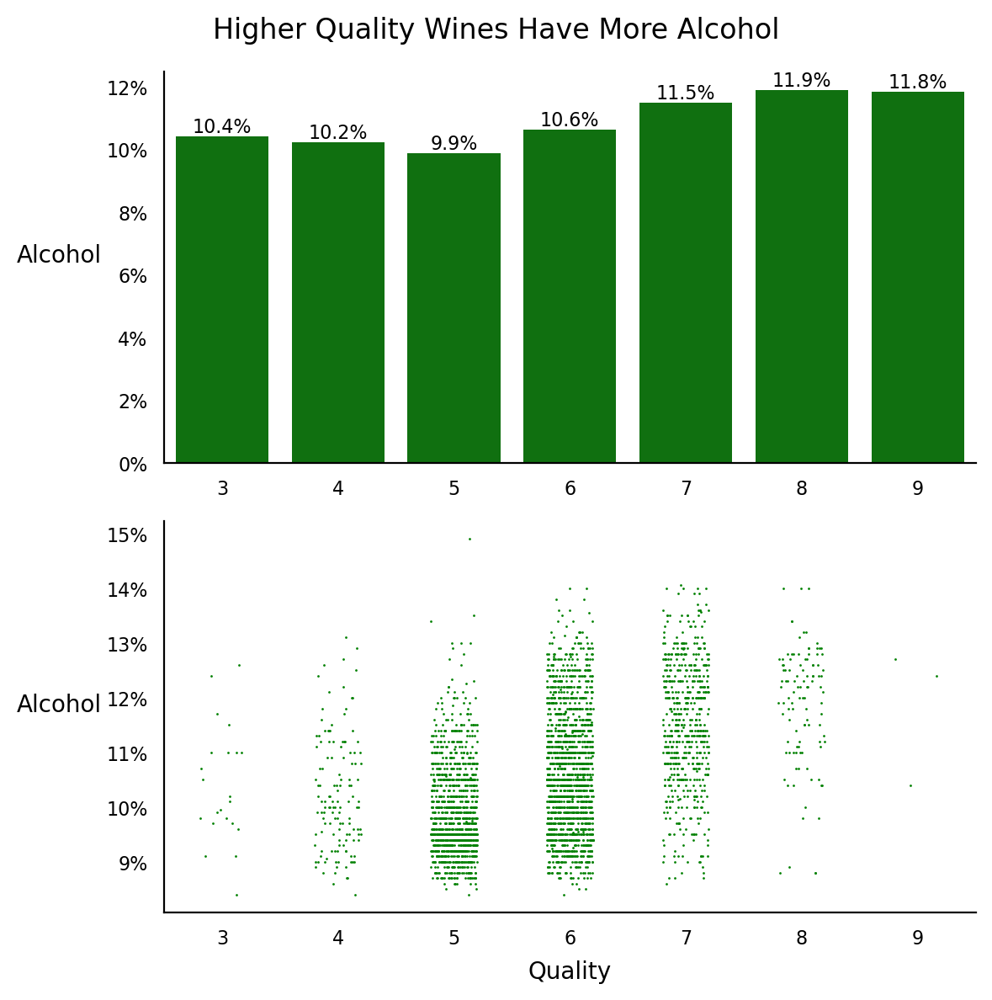

In [45]:
plot_alcohol_by_quality()

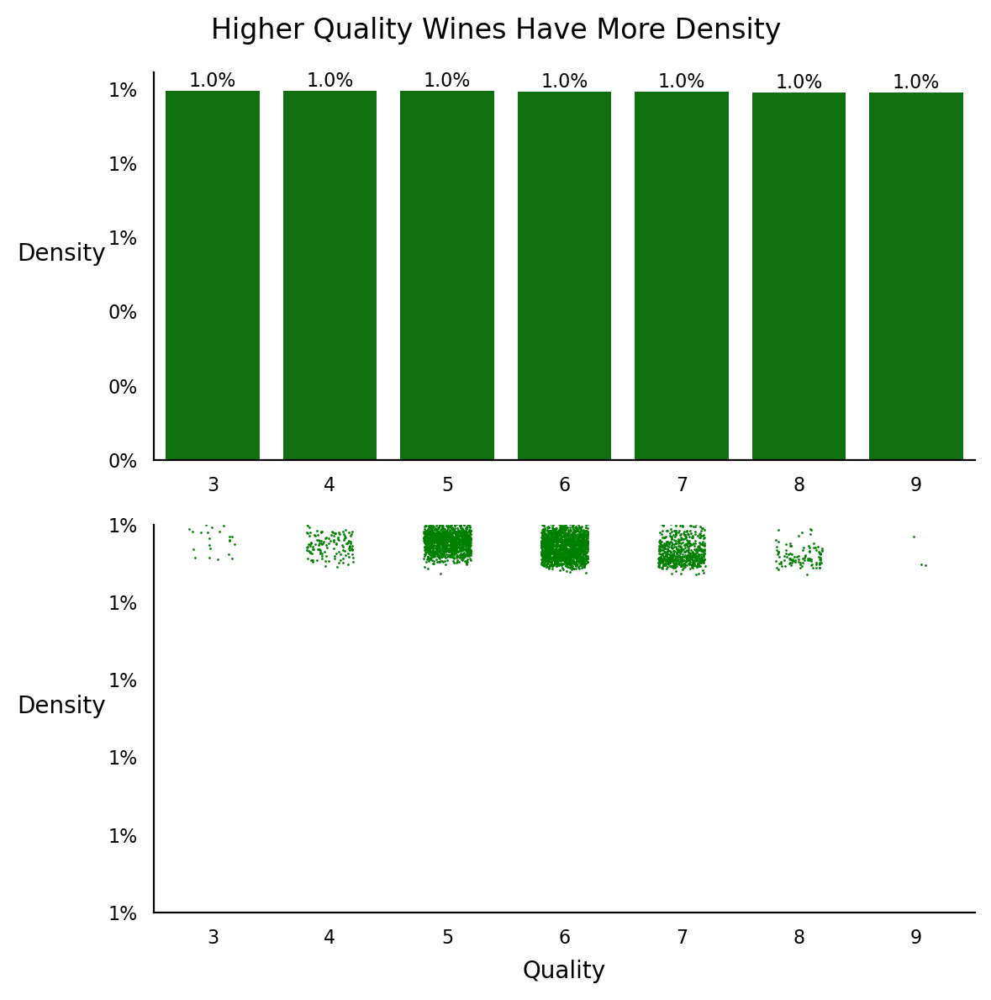

In [46]:
plot_density_by_quality()

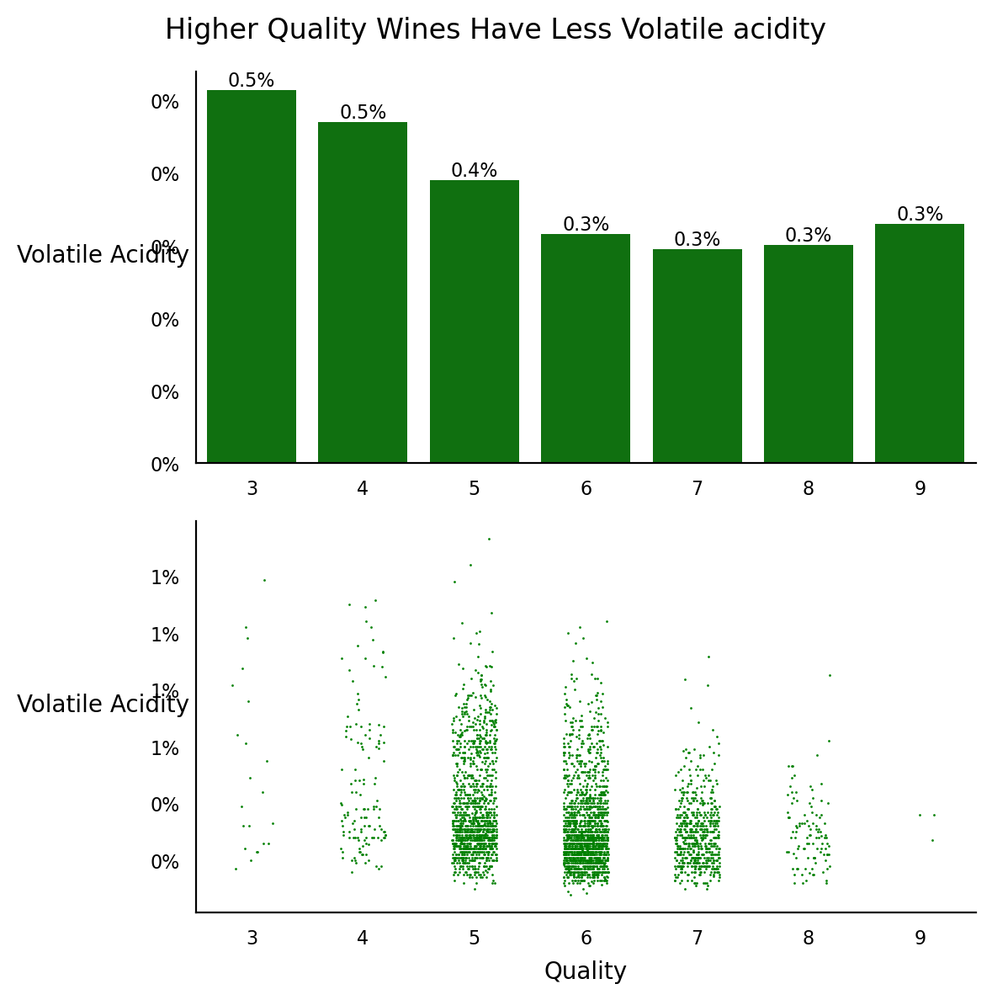

In [47]:
plot_volatile_acidity_by_quality()

## Stats testing for relationship to target

In [48]:
lst = mc_1 + mc_2

NameError: name 'mc_1' is not defined

In [49]:
lst = list(set(lst))
lst


NameError: name 'lst' is not defined

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named 'train' with the columns you want to plot against 'quality'
# You can create a list of all feature columns (excluding the target 'quality')
feature_columns = lst

# Loop through the feature columns and create scatter plots against 'quality'
for feature in feature_columns:
    sns.lmplot(data=train, x=feature, y='quality', scatter_kws={'alpha':0.3})
    plt.title(f'{feature} plotted against quality')
    plt.show()

    r, p = pearsonr(train[feature], train['quality'])
    print(f'''
    Null: these are not related
    Alternative: these are related
    
    Results:
    R = {r}
    P = {p}''')
    
    if p <= .05:
        print('\nThese features are related\n')
    else:
        print('\nThese features are not related\n')

NameError: name 'lst' is not defined

## Observations:
#### MULTICOLINEARITY:

- alcohol and ph might have some correlation
- sulfates and density
- chlorides and sulfates
- residual sugar and density
- residual sugar and citric acid
- sulfates and free sulfur dioxide
- total sulfurdioxide and free sulfur dioxide

#### TARGET PREDICTORS:
- alcohol seems to have a weak correlation with quality
- residual sugar
- citric acid
- fixed acidity
- free sulfur dioxide
- ph

- can i bin anything?
- hue by color

- outlier handling may improve the model
- we might want to build separate models for red and white wine because of the imbalance


ph-quality
free sulfur dioxide-quality
fixed acidity-quality
ctric acid-quality
residualsugar-qualtiy
alcohol-quality

multicolinearities to consider (which one is more correlated to the target?):
alcohol-ph (equal relationship)

* alcohol  (.47)  and ph (.05)
* sulfates (.05) and density (-.33)
* chlorides (-.2)  and sulfates (.05)
* residual sugar (-.05) and density (-.33)
* residual sugar (-.05) and citric acid (.09)
* sulfates (.05) and free sulfur dioxide (.04)
* total sulfurdioxide (-.05) and free sulfur dioxide (.04)

##
* ph (.05)
* sulfates (.05)
* density (-.33)
* citric acid (.09)
* total sulfurdioxide (-.05)


## ---Clustering---

In [51]:
X_train, y_train = train.drop(columns='quality'), train.quality
X_validate, y_validate = validate.drop(columns='quality'), validate.quality
X_test, y_test = test.drop(columns='quality'), test.quality

<Axes: xlabel='alcohol', ylabel='quality'>

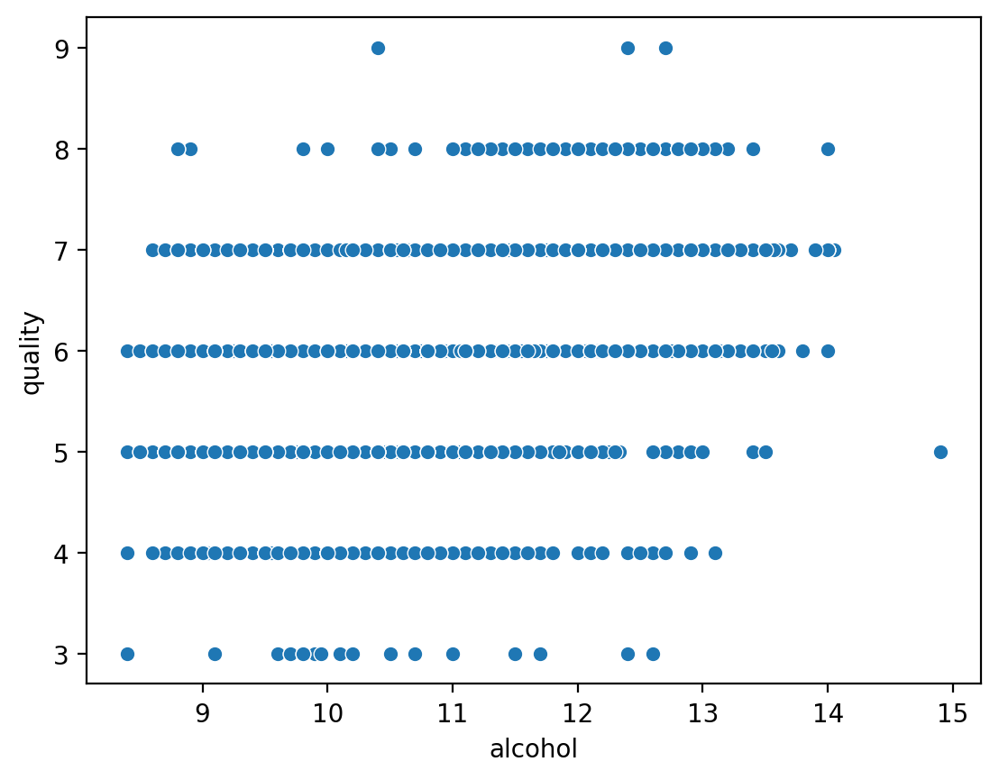

In [52]:
sns.scatterplot(data=train, x='alcohol', y='quality')

In [53]:
X_train.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,red
324,10.0,0.49,0.20,11.0,0.071,13.0,50.0,1.00150,3.16,0.69,9.2,1
3630,6.6,0.30,0.25,8.0,0.036,21.0,124.0,0.99362,3.06,0.38,10.8,0
3292,6.6,0.28,0.41,7.0,0.046,59.0,194.0,0.99558,3.14,0.48,9.4,0
833,11.6,0.47,0.44,1.6,0.147,36.0,51.0,0.99836,3.38,0.86,9.9,1
4631,6.6,0.21,0.39,2.3,0.041,31.0,102.0,0.99221,3.22,0.58,10.9,0


In [54]:
X_train = X_train.rename(columns={'volatile acidity': 'volatile_acidity'})

In [55]:
scaler = MinMaxScaler()
features = ['alcohol', 'pH', 'density']
train[['alc_scaled','ph_scaled', 'density_scaled']] = scaler.fit_transform(X_train[features])

/Users/Scott/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


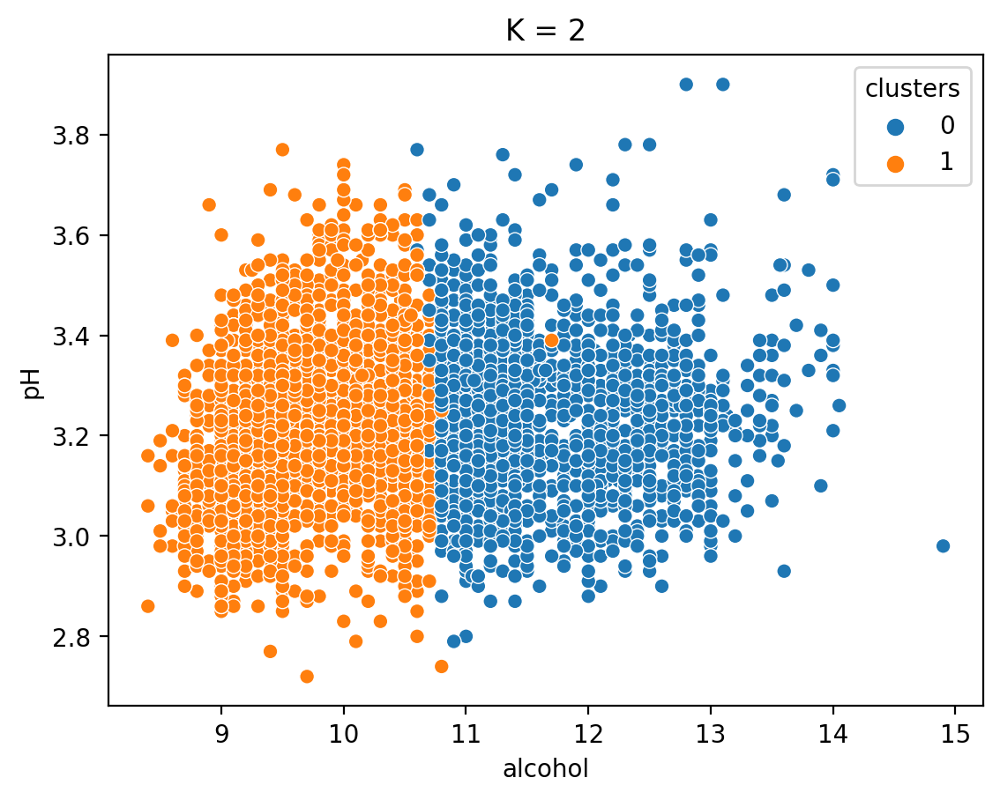

/Users/Scott/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


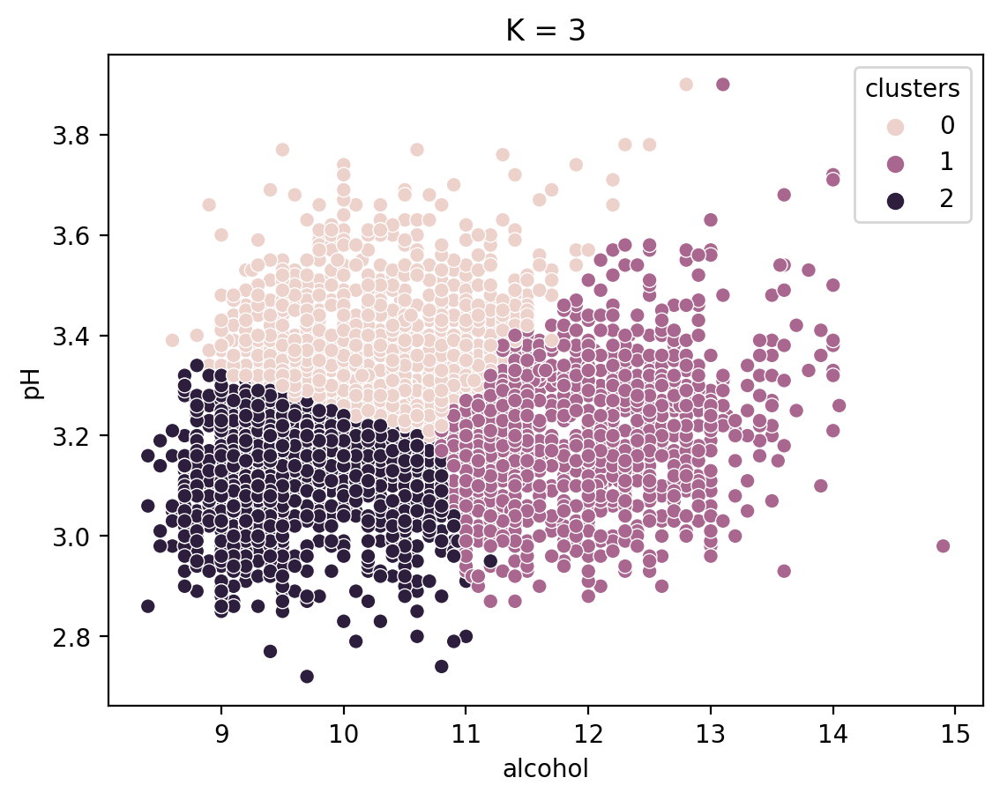

/Users/Scott/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


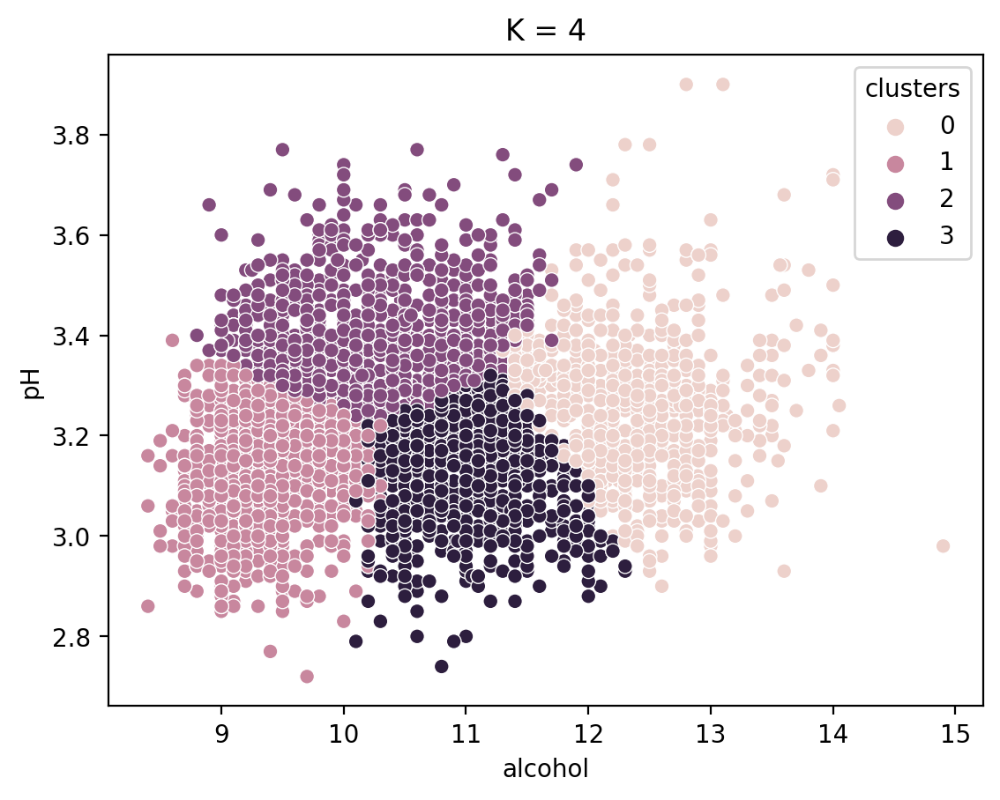

/Users/Scott/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


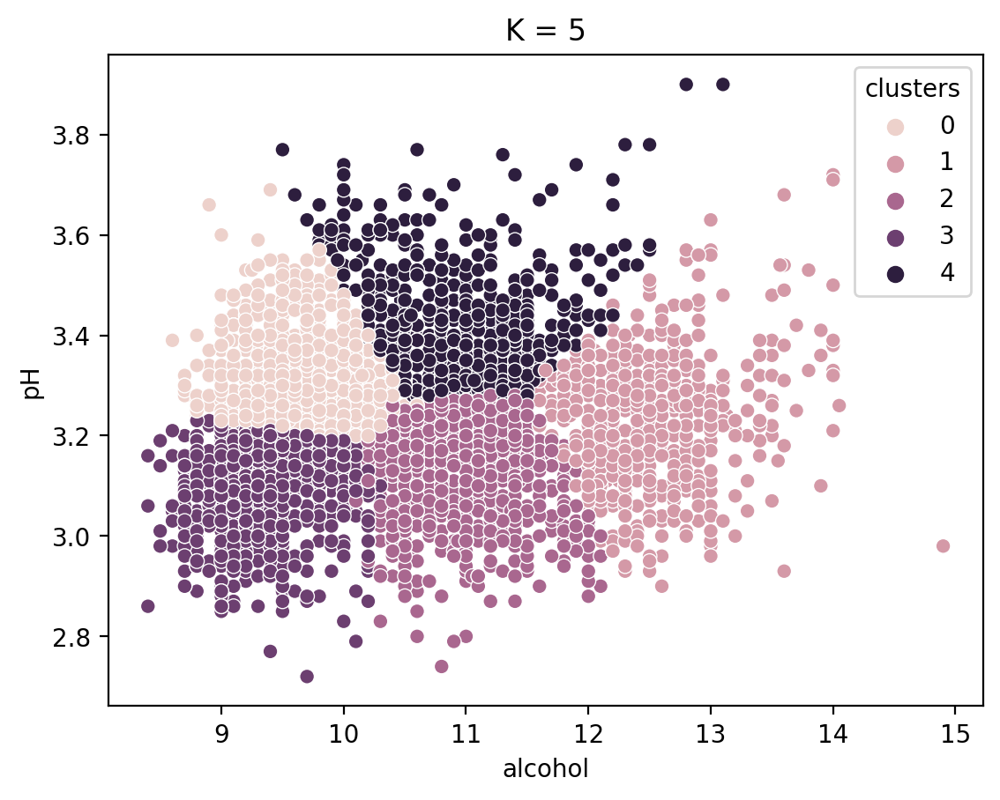

In [56]:
X = train[['alc_scaled','ph_scaled', 'density_scaled']]
for i in range(2, 6):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(X)
    train['clusters'] = kmeans.predict(X)
    sns.scatterplot(data=train, x=X_train.alcohol, y=X_train['pH'], hue=train.clusters)
    plt.title(f'K = {i}')
    plt.show()

/Users/Scott/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/Scott/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/Scott/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/Scott/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/Scott/anacond

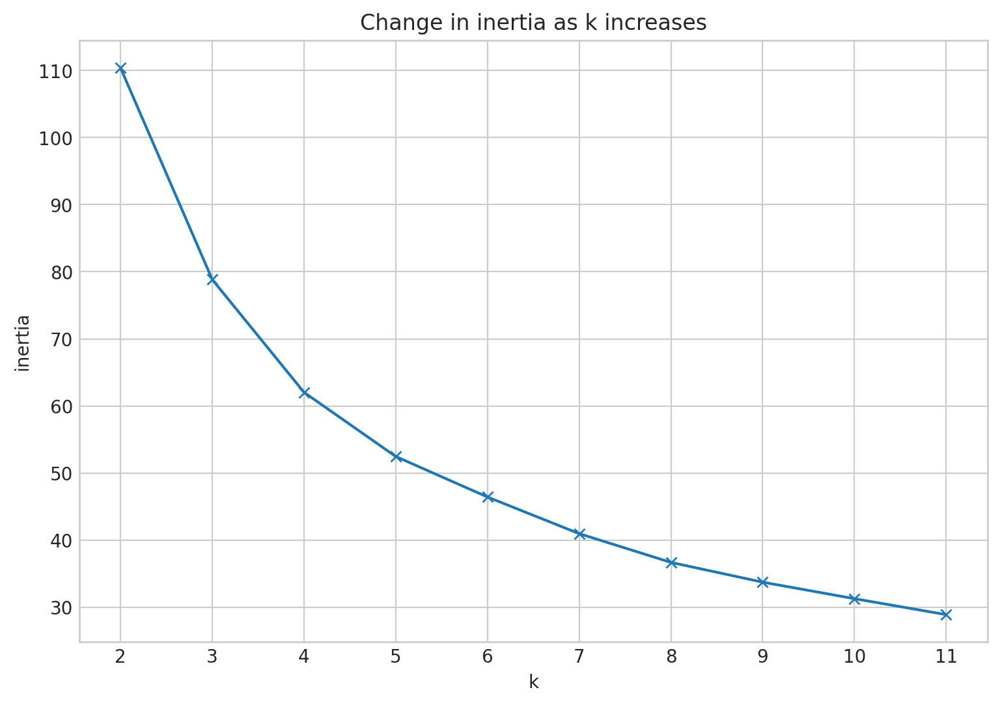

In [57]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(9, 6))
    pd.Series({k: KMeans(k).fit(X).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.xticks(range(2, 12))
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')


## The elbow is on k = 4

In [58]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(X)
train['clusters'] = kmeans.predict(X)

/Users/Scott/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [59]:
train.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,red,alc_scaled,ph_scaled,density_scaled,clusters
324,10.0,0.49,0.20,11.0,0.071,13.0,50.0,1.00150,3.16,0.69,9.2,6,1,0.123077,0.372881,0.277424,0
3630,6.6,0.30,0.25,8.0,0.036,21.0,124.0,0.99362,3.06,0.38,10.8,6,0,0.369231,0.288136,0.125506,3
3292,6.6,0.28,0.41,7.0,0.046,59.0,194.0,0.99558,3.14,0.48,9.4,5,0,0.153846,0.355932,0.163293,0
833,11.6,0.47,0.44,1.6,0.147,36.0,51.0,0.99836,3.38,0.86,9.9,4,1,0.230769,0.559322,0.216888,2
4631,6.6,0.21,0.39,2.3,0.041,31.0,102.0,0.99221,3.22,0.58,10.9,7,0,0.384615,0.423729,0.098323,3


## Ideas for feature reduction:

#### drop or combine away multicolinearities:
- combine free sulfure dioxide and total sulfur dioxide into a ratio
- volatile acidity and citric acid??
- fixed acidity and volatile acidity and pH
- alcohol and density

In [60]:
train.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'red', 'alc_scaled',
       'ph_scaled', 'density_scaled', 'clusters'],
      dtype='object')

In [61]:
lst_1 = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density','pH', 'sulphates', 'alcohol', 'quality']

In [62]:
lst_2= []

for i in range(1, len(lst_1)+1):
    item = lst_1[-i]
    lst_2.append(item)


In [63]:
df = train[['pH', 'chlorides', 'sulphates', 'alcohol', 'residual sugar', 'density']]

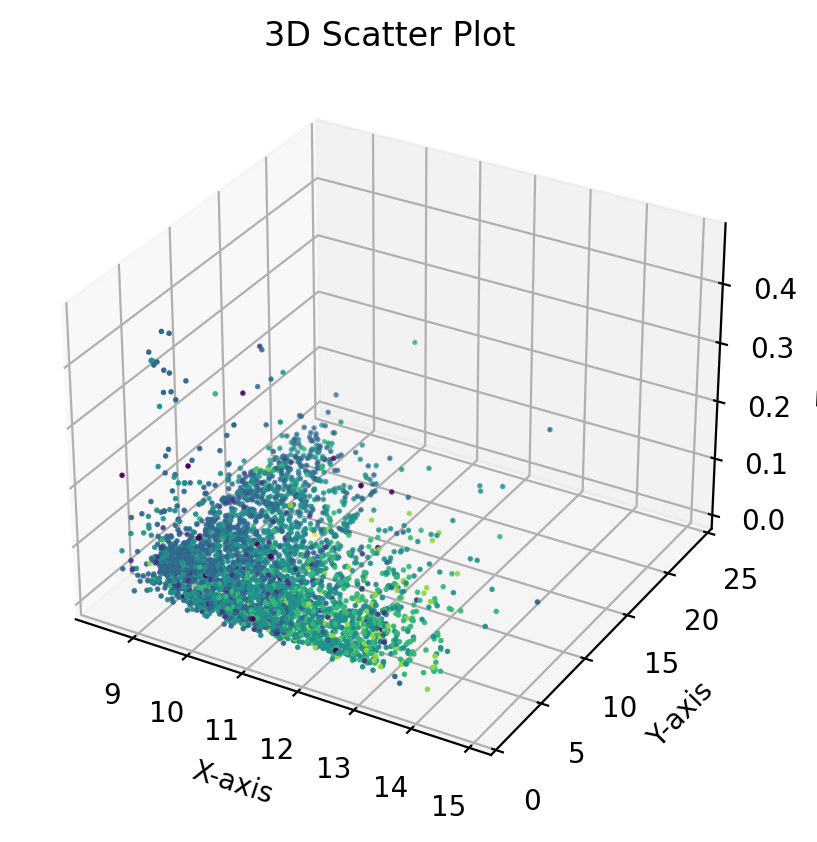

In [64]:
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

# Sample data with three dimensions (x, y, z)
x = train['alcohol']
y = train['residual sugar']
z = train['chlorides']

# Create a 3D figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the data points as a scatter plot
scatter = ax.scatter(x, y, z, c=train.quality, cmap='viridis', s=1)

ax.set_ylim(0, 25)

# Set labels for the axes
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')

# Set the title of the plot
ax.set_title('3D Scatter Plot')

# Show the plot
plt.show()


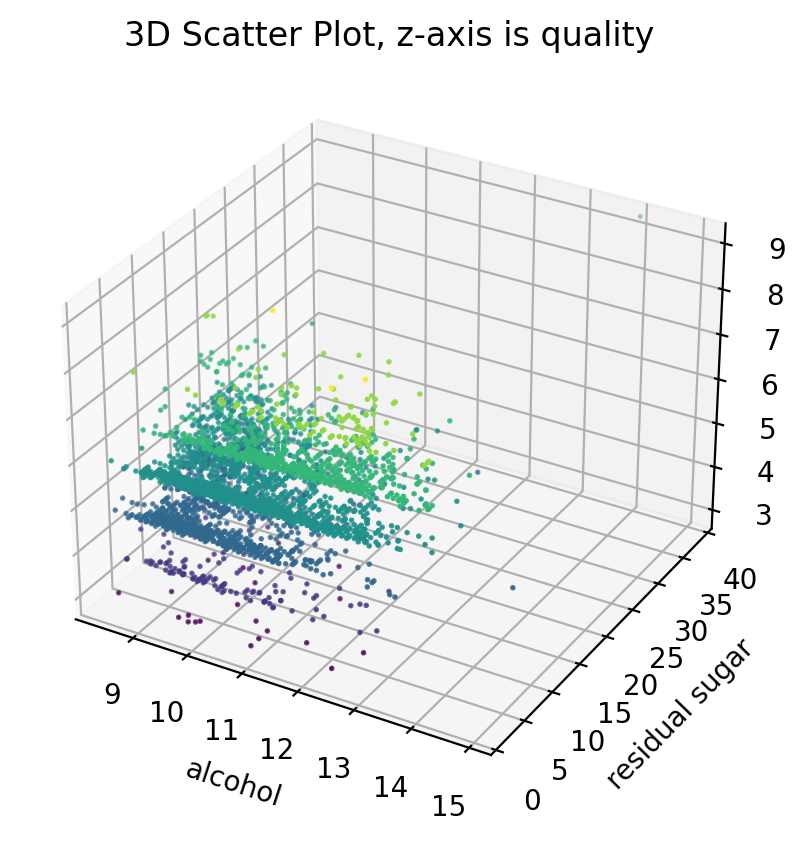

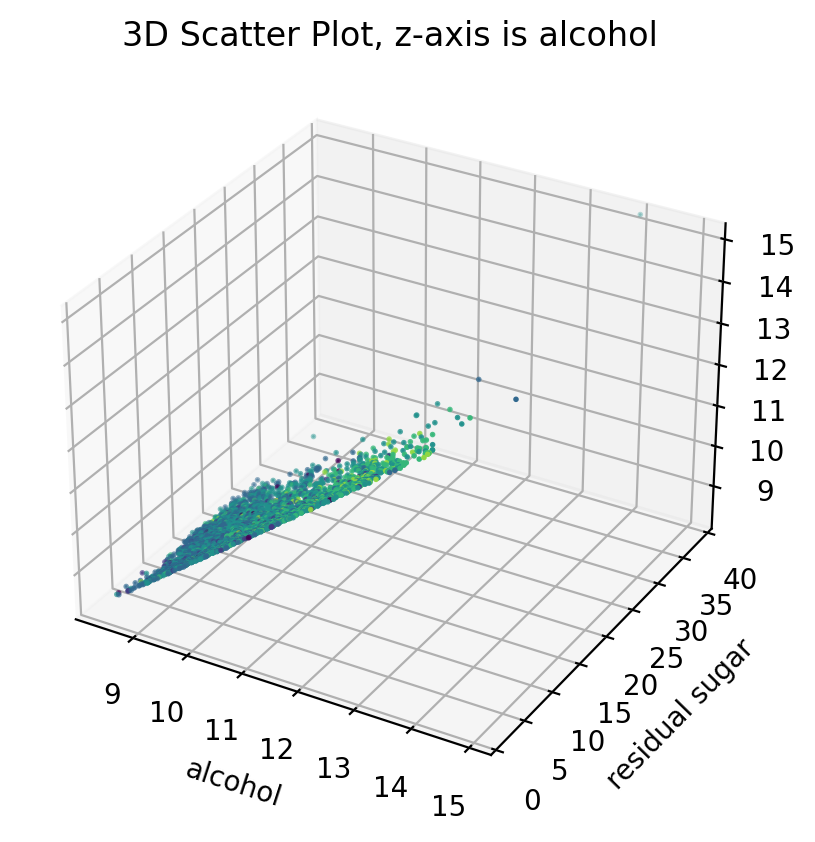

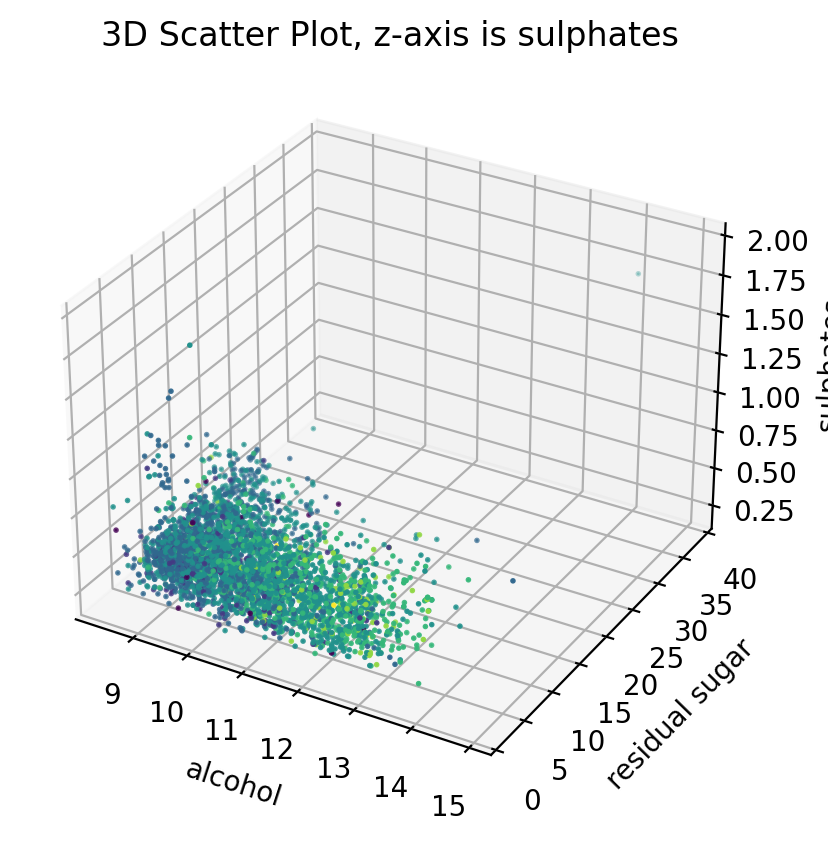

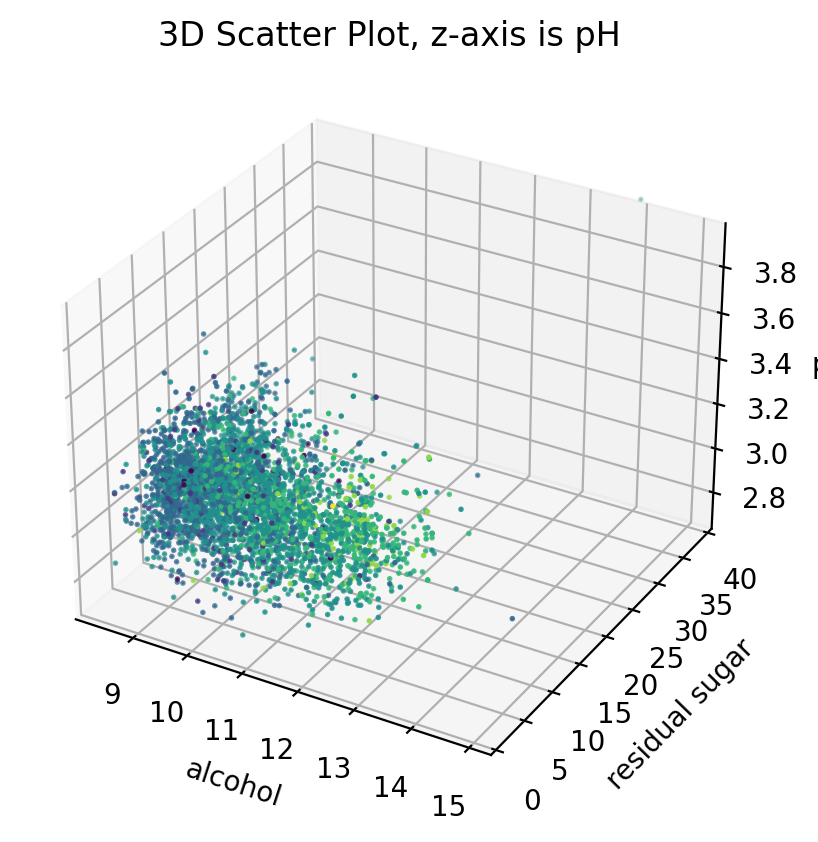

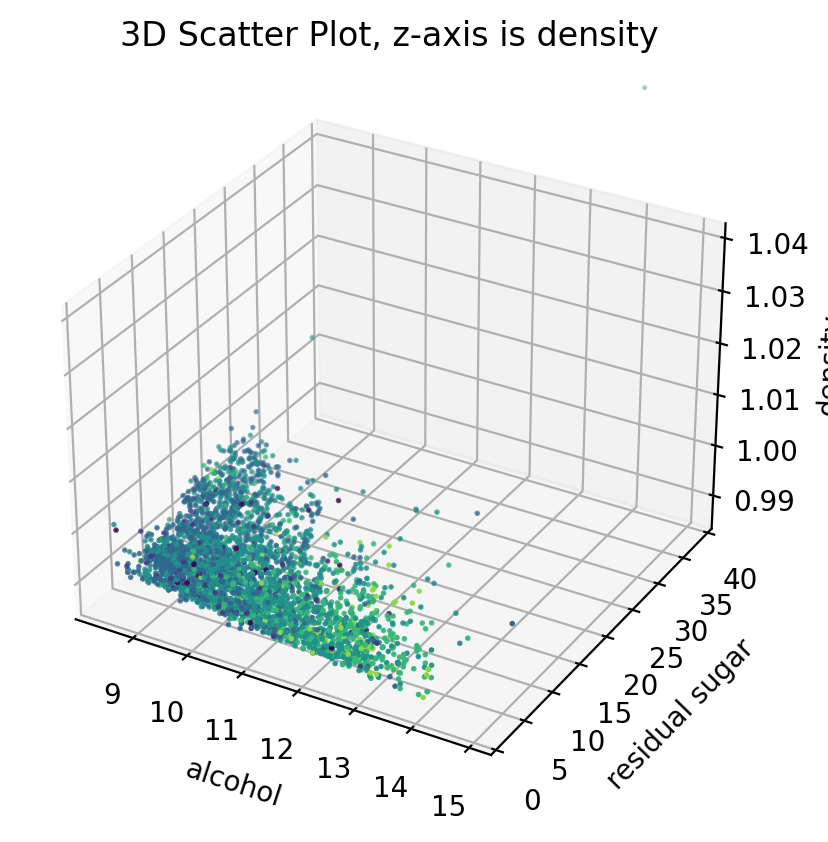

...

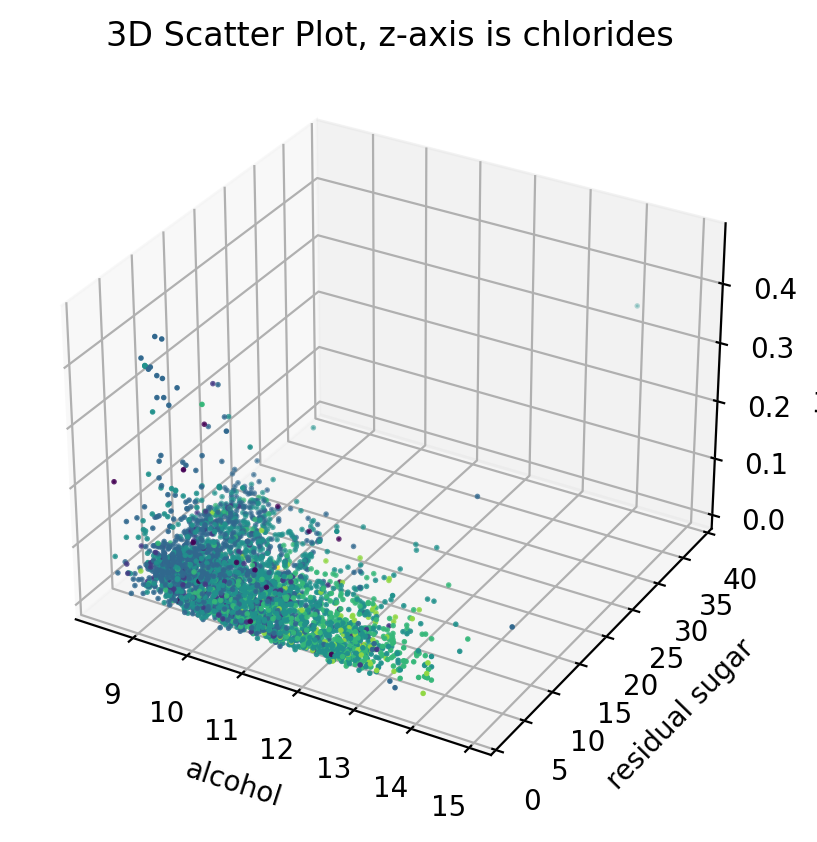

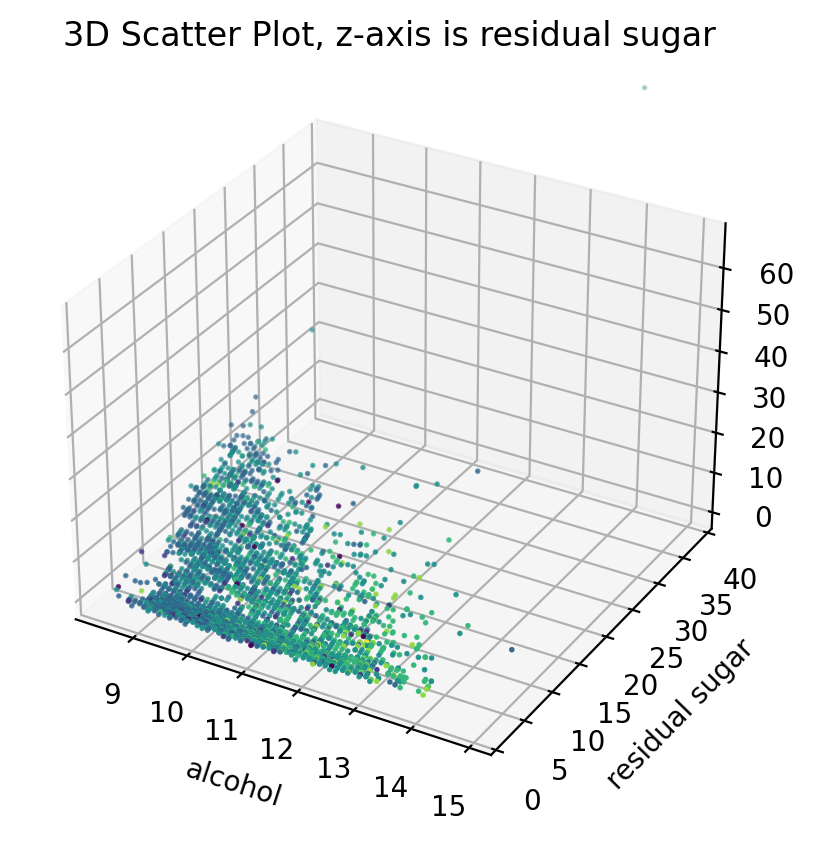

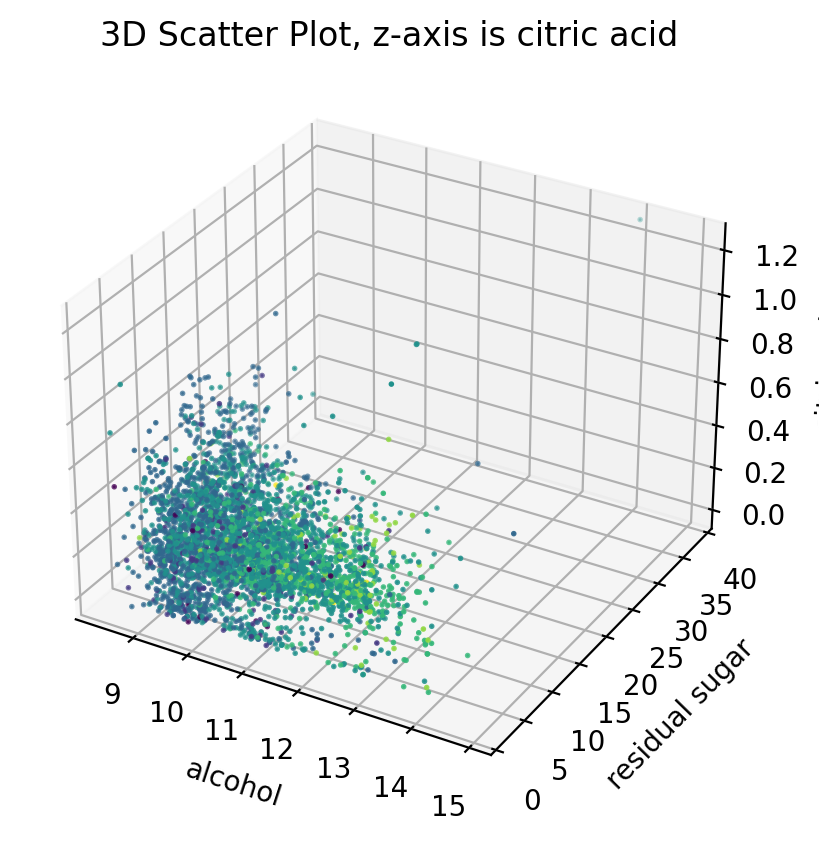

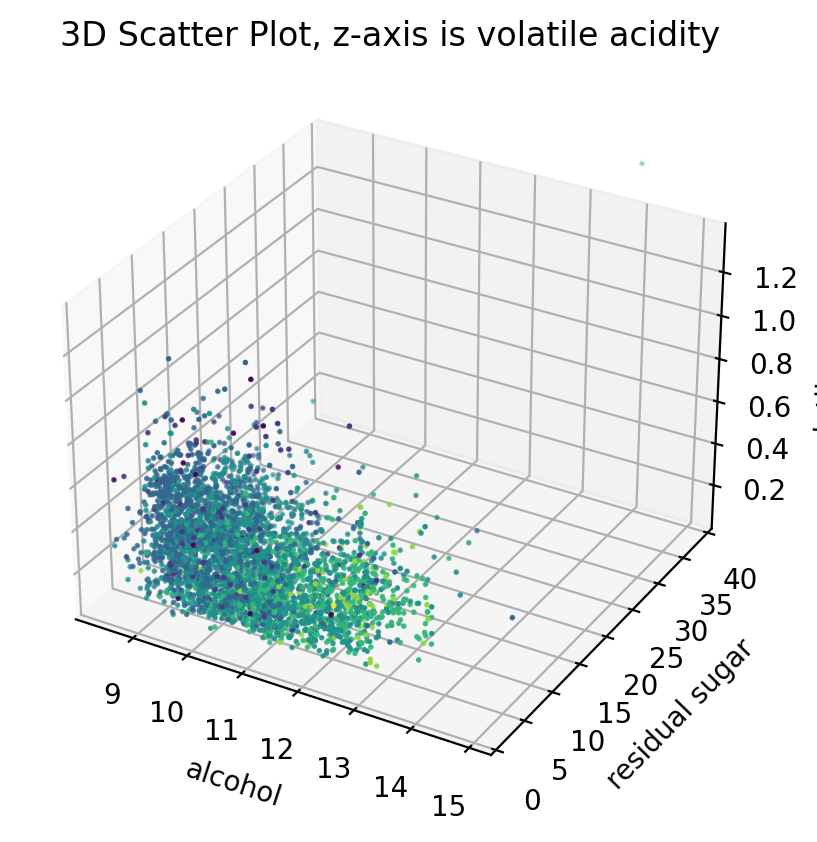

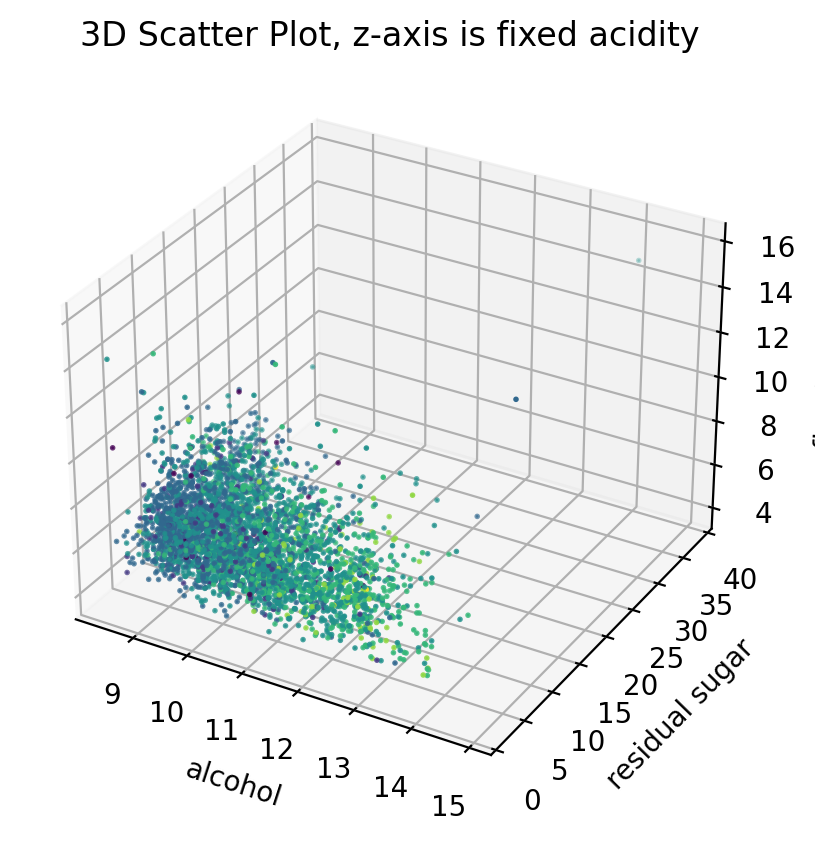

In [65]:
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

for i in lst_2:
    # Sample data with three dimensions (x, y, z)
    x = train['alcohol']
    y = train['residual sugar']
    z = train[i]

    # Create a 3D figure
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # Plot the data points as a scatter plot
    scatter = ax.scatter(x, y, z, c=train.quality, cmap='viridis', s=1)

    ax.set_ylim(0, 40)
    # Set labels for the axes
    ax.set_xlabel('alcohol')
    ax.set_ylabel('residual sugar')
    ax.set_zlabel(f'{i}')

    # Set the title of the plot
    ax.set_title(f'3D Scatter Plot, z-axis is {i}')

    # Show the plot
    plt.show()


In [66]:
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d


def threedee_feature_shifting():
    '''
    Set the 'lists' list to sets of three predictive features and run this function to produce visualizations
    of each set of features in three dimensions from each perspective. Useful in clustering projects.
    
    '''
    import matplotlib.pyplot as plt
    from mpl_toolkits import mplot3d
    
    #enter combinations of your predictive features here
    lists = [['volatile acidity', 'density', 'citric acid'], 
             ['volatile acidity', 'density', 'alcohol'],
             ['volatile acidity', 'density', 'alcohol'],
             ['alcohol', 'residual sugar', 'pH'],
             ['alcohol', 'residual sugar', 'sulphates'],
             ['alcohol', 'citric acid', 'pH'],
             ['alcohol', 'density', 'chlorides'],
             ['alcohol', 'volatile acidity', 'chlorides']]


    figsize = (20, 20)
    
    #
    for k in range(len(lists)):
        for i in range(0,3):
            # Sample data with three dimensions (x, y, z)
            x = train[lists[k][(1 + i) % 3]]
            y = train[lists[k][(2 + i) % 3]]
            z = train[lists[k][(3 + i) % 3]]

            # Create a 3D figure
            fig = plt.figure()
            ax = fig.add_subplot(111, projection='3d')

            # Plot the data points as a scatter plot
            scatter = ax.scatter(x, y, z, c=train.quality, cmap='viridis', s=1)

            ax.set_ylim(0, 40)
            # Set labels for the axes
            ax.set_xlabel(lists[k][(1 + i) % 3])
            ax.set_ylabel(lists[k][(2 + i) % 3])
            ax.set_zlabel(lists[k][(3 + i) % 3])

            # Set the title of the plot
            ax.set_title(f'3D Scatter Plot, z-axis is {lists[k][i]}')

            # Show the plot
            plt.show()

        print('-----------------------')


In [67]:
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import itertools

def threedee_feature_shifting(train, predictive_features, target):
    '''
    Set the 'lists' list to sets of three predictive features and run this function to produce visualizations
    of each set of features in three dimensions from each perspective. Useful in clustering projects. Sort of a 3D pairplot.
    
    '''
    # Generate all combinations of the elements with different lengths (1 to len(elements))
    all_combinations = []
    
    combinations = list(itertools.combinations(predictive_features, 3))
    all_combinations.extend(combinations)
    
    # Convert the list of tuples to a list of lists using list comprehension
    lists_of_combinations = [list(combination) for combination in all_combinations]
    
                                                       
    figsize = (8, 8)
    
    # iterates through each first-order list
    for k in range(len(lists_of_combinations)):
        
        # Prints the header
        print(f'Combination {k}: {lists_of_combinations[k]}')
              
        # iterates through the three combinations of each second-order list
        for i in range(0,3):
            
            # Sample data with three dimensions (x, y, z)
            x = train[lists_of_combinations[k][(1 + i) % 3]]
            y = train[lists_of_combinations[k][(2 + i) % 3]]
            z = train[lists_of_combinations[k][(3 + i) % 3]]
            
            # Calculate each subplot coord
            rows = str(1)
            columns = str(3)
            num = str(i+1)
            coord = int(rows + columns + num)

            # Create a 3D figure
            fig = plt.figure()
            ax = fig.add_subplot(coord, projection='3d')

            # Plot the data points as a scatter plot
            scatter = ax.scatter(x, y, z, c=train[target], cmap='viridis', s=1)

            # Set your x and y ranges
            ax.set_xlim(x.min(), x.max())
            ax.set_ylim(y.min(), y.max())
            ax.set_zlim(z.min(), z.max())
            
            # Set labels for the axes
            ax.set_xlabel(lists_of_combinations[k][(1 + i) % 3])
            ax.set_ylabel(lists_of_combinations[k][(2 + i) % 3])
            ax.set_zlabel(lists_of_combinations[k][(3 + i) % 3])

            # Set the title of the plot
            ax.set_title(f'Z-axis is {lists_of_combinations[k][i]}')

            # Show the plot
            plt.show()

        print('-----------------------\n')


In [68]:
features = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density','pH', 'sulphates', 'alcohol']

Combination 0: ['fixed acidity', 'volatile acidity', 'citric acid']


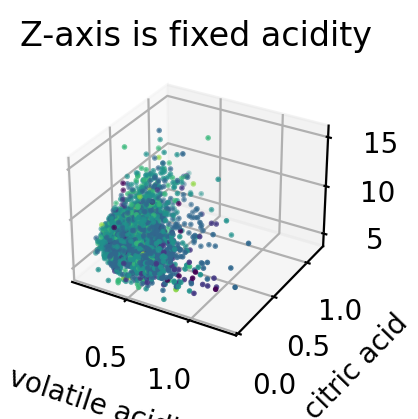

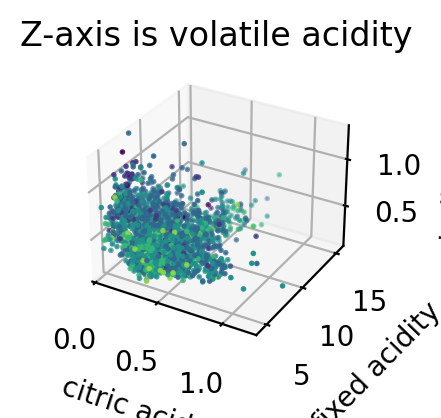

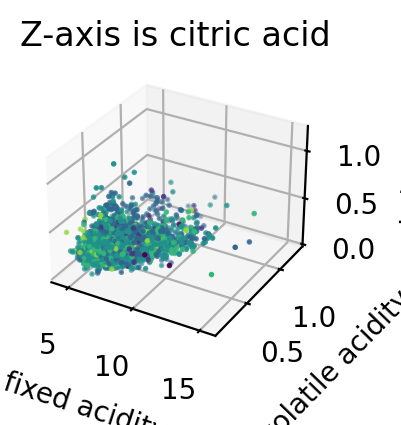

-----------------------

Combination 1: ['fixed acidity', 'volatile acidity', 'residual sugar']


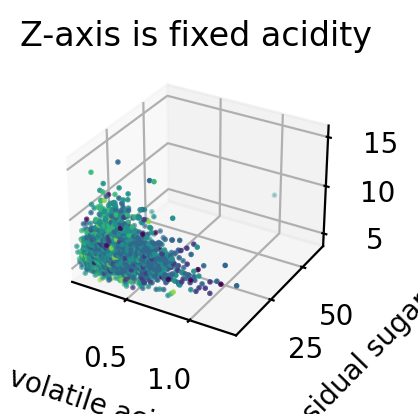

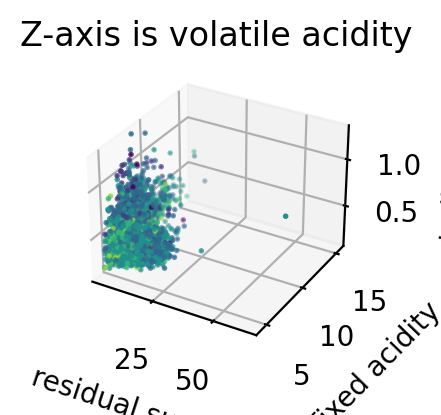

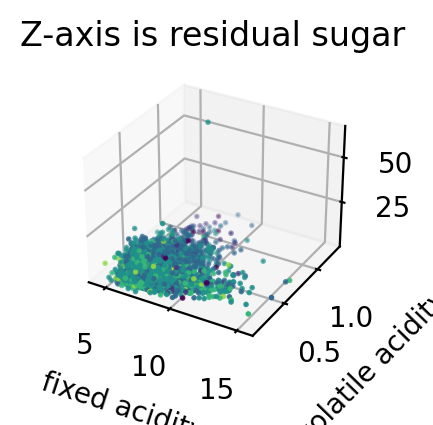

-----------------------

Combination 2: ['fixed acidity', 'volatile acidity', 'chlorides']


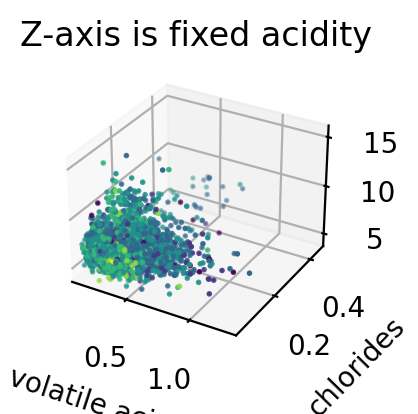

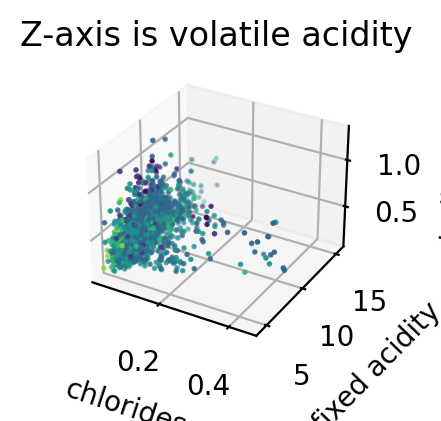

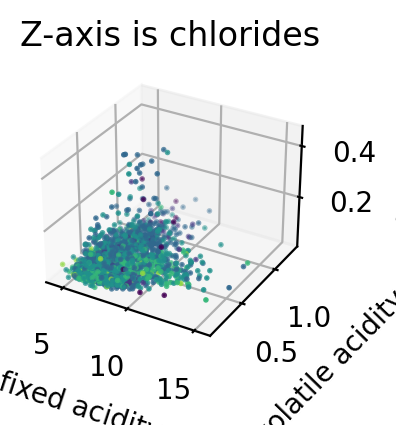

-----------------------

Combination 3: ['fixed acidity', 'volatile acidity', 'free sulfur dioxide']


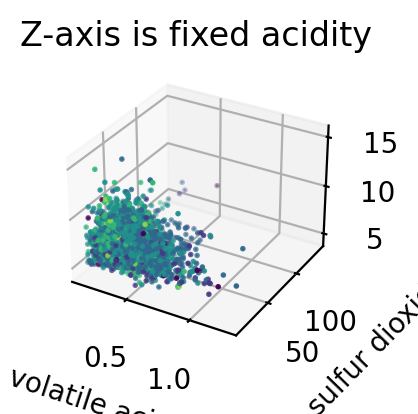

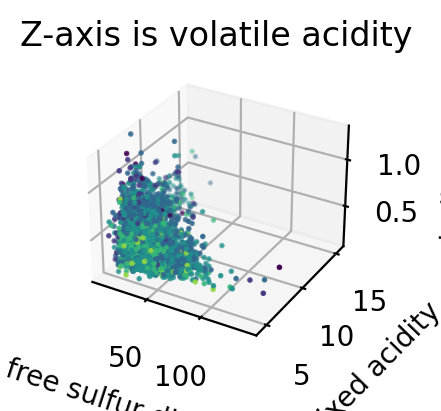

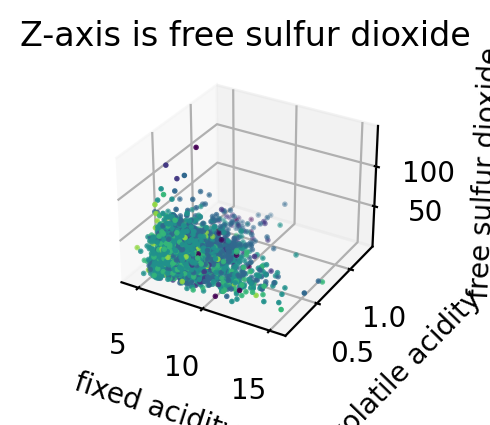

-----------------------

Combination 4: ['fixed acidity', 'volatile acidity', 'total sulfur dioxide']


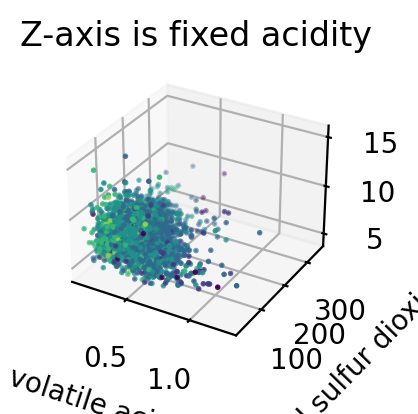

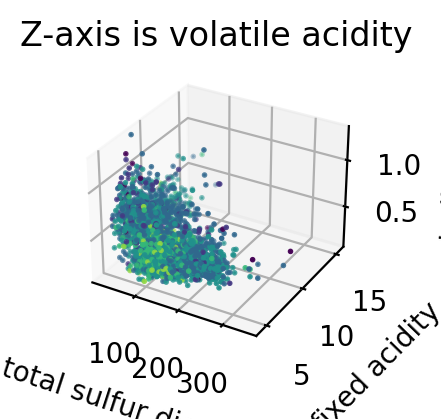

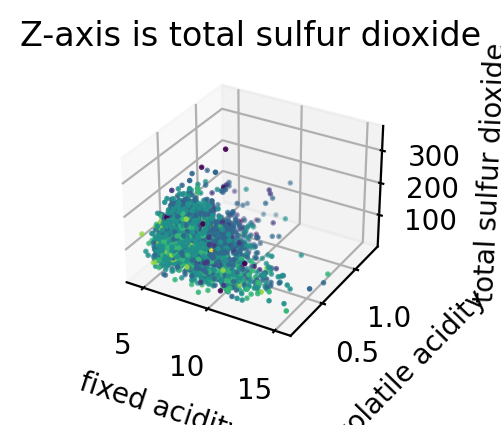

-----------------------

Combination 5: ['fixed acidity', 'volatile acidity', 'density']


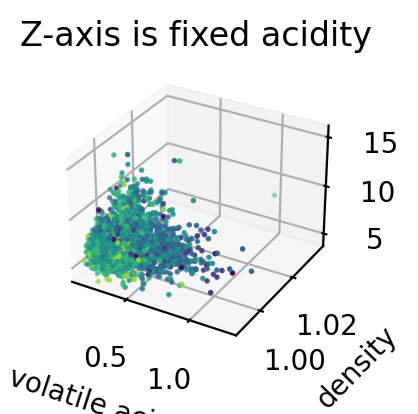

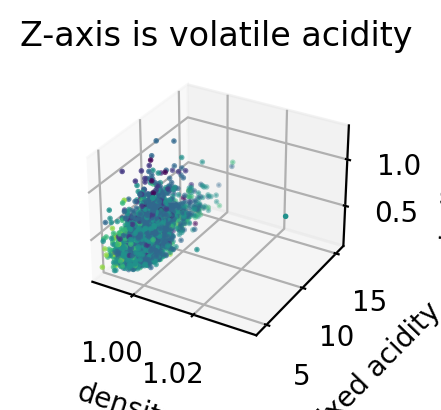

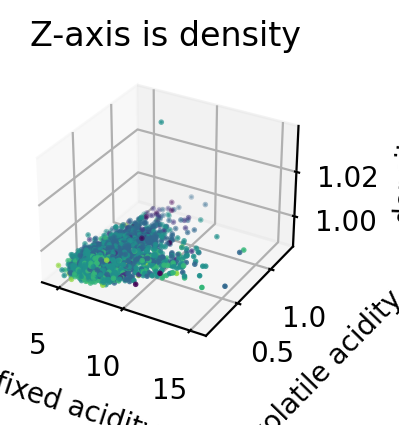

-----------------------

Combination 6: ['fixed acidity', 'volatile acidity', 'pH']


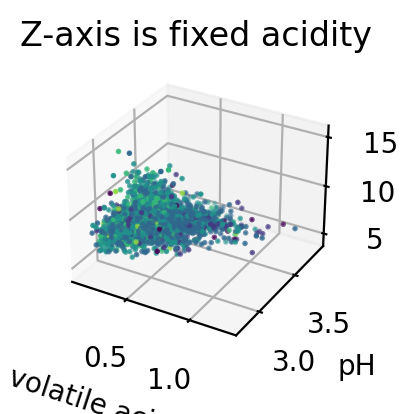

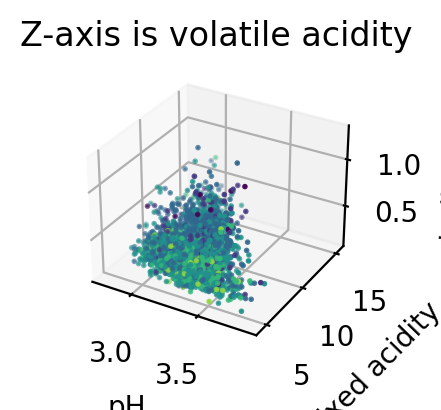

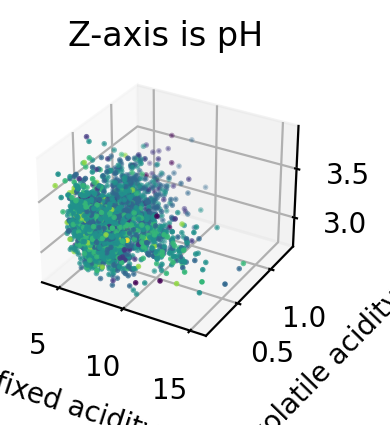

-----------------------

Combination 7: ['fixed acidity', 'volatile acidity', 'sulphates']


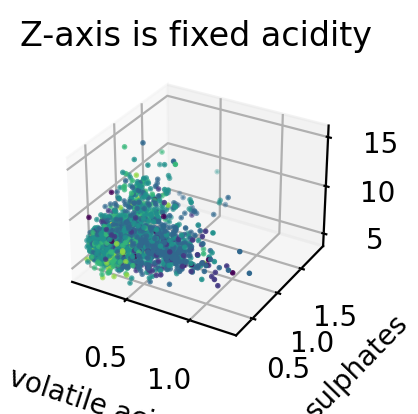

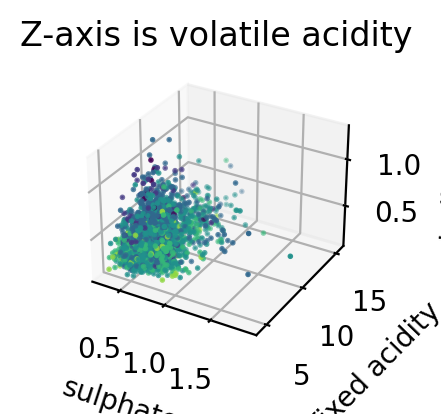

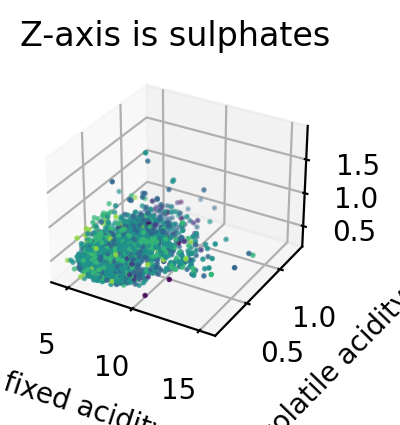

-----------------------

Combination 8: ['fixed acidity', 'volatile acidity', 'alcohol']


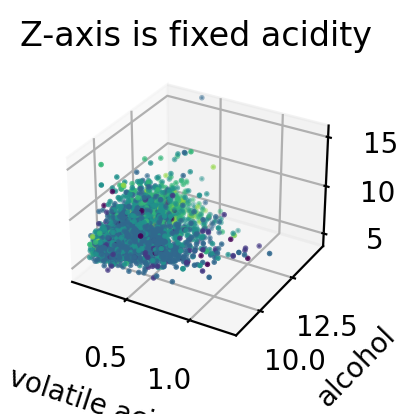

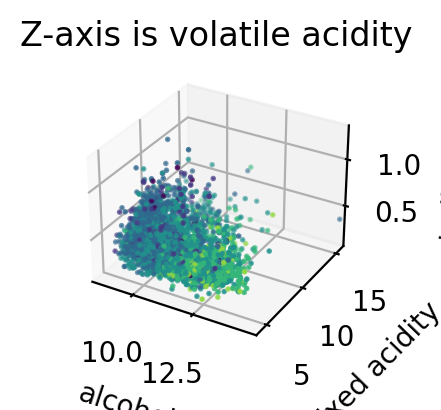

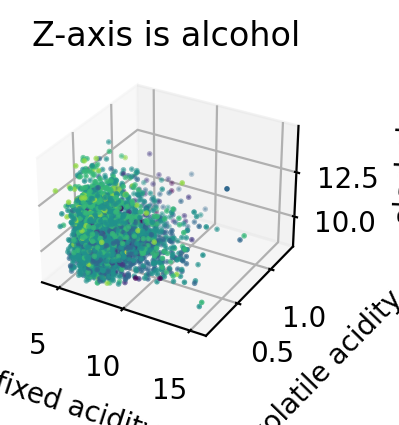

-----------------------

Combination 9: ['fixed acidity', 'citric acid', 'residual sugar']


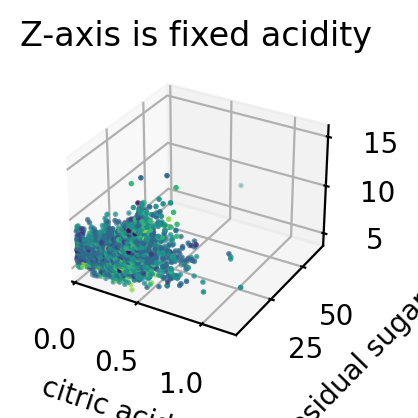

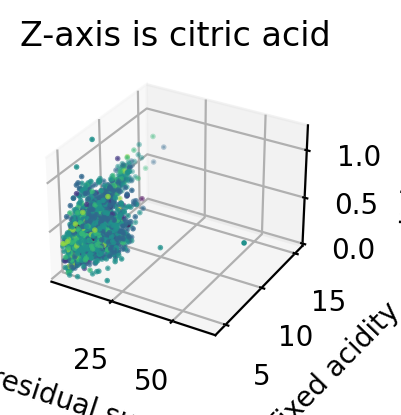

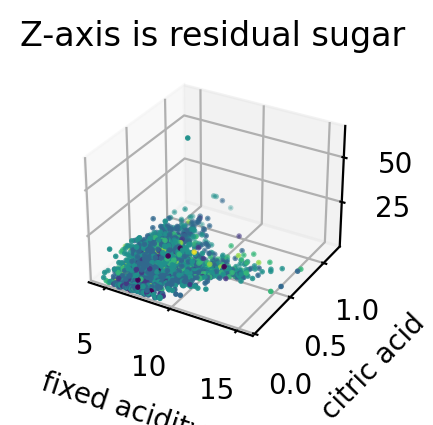

-----------------------

Combination 10: ['fixed acidity', 'citric acid', 'chlorides']


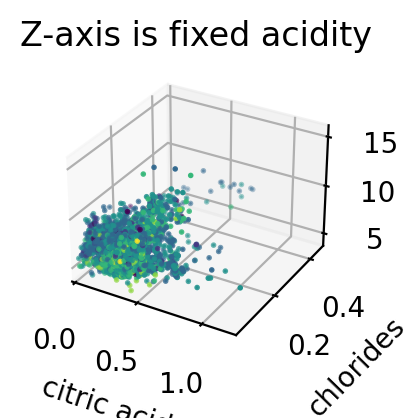

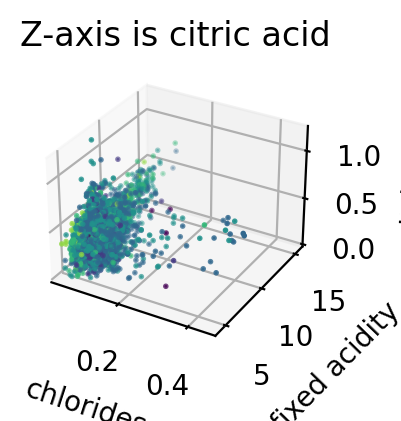

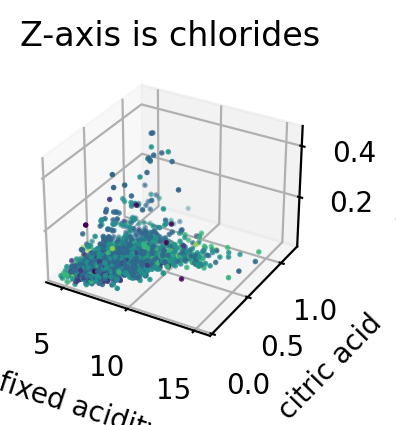

-----------------------

Combination 11: ['fixed acidity', 'citric acid', 'free sulfur dioxide']


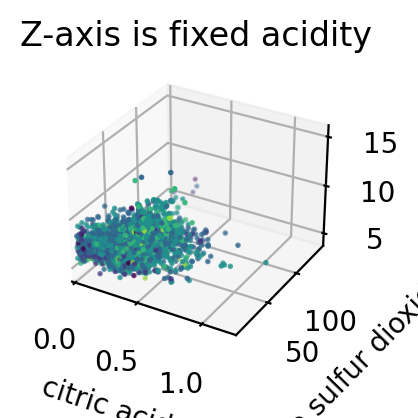

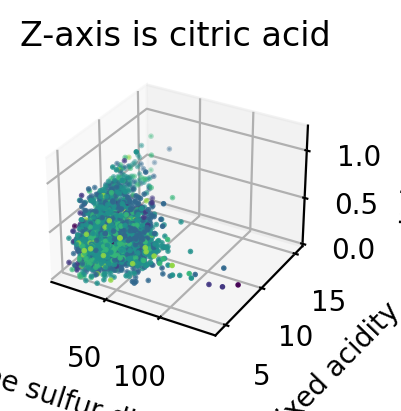

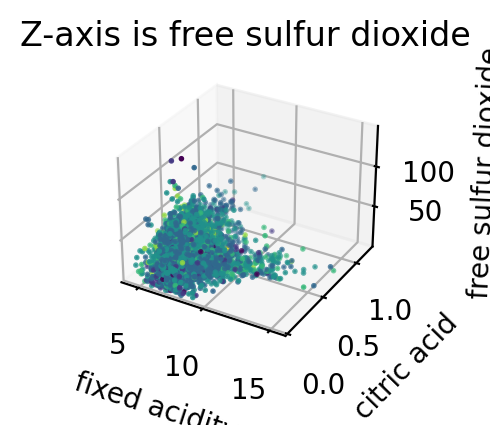

-----------------------

Combination 12: ['fixed acidity', 'citric acid', 'total sulfur dioxide']


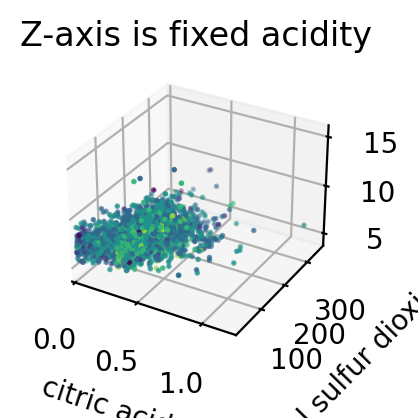

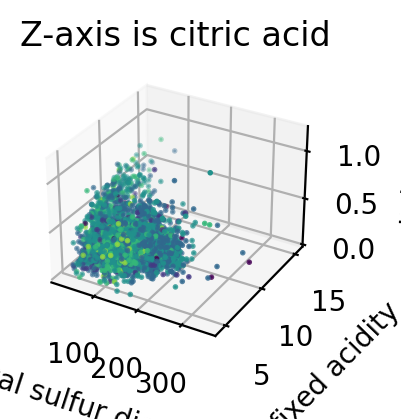

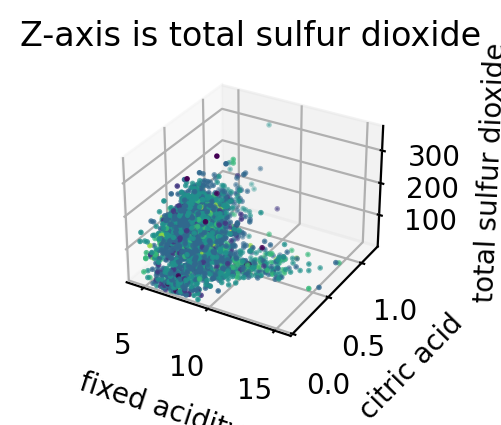

-----------------------

Combination 13: ['fixed acidity', 'citric acid', 'density']


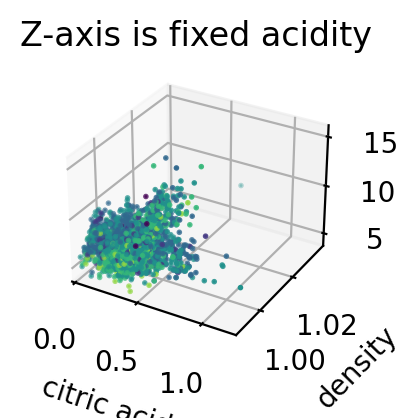

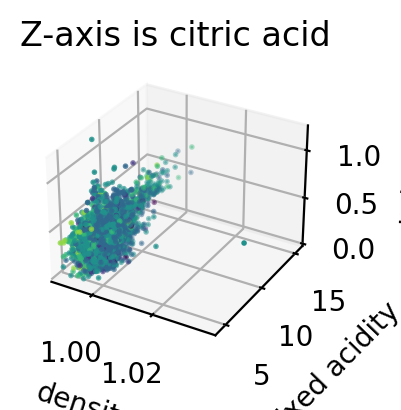

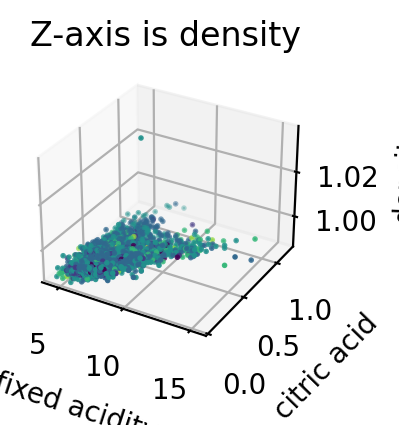

-----------------------

Combination 14: ['fixed acidity', 'citric acid', 'pH']


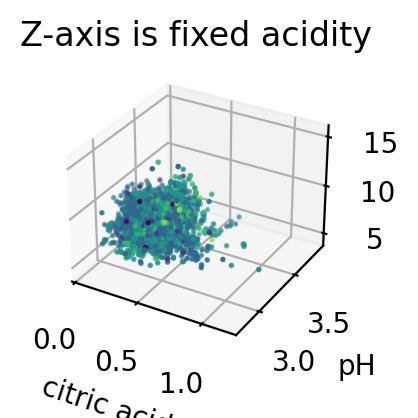

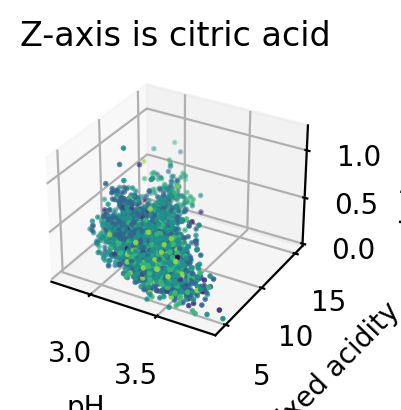

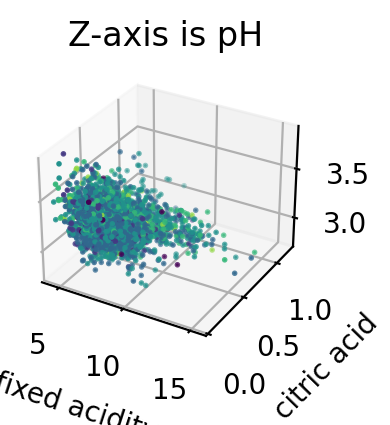

-----------------------

Combination 15: ['fixed acidity', 'citric acid', 'sulphates']


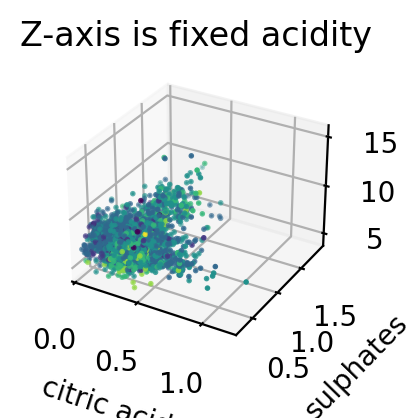

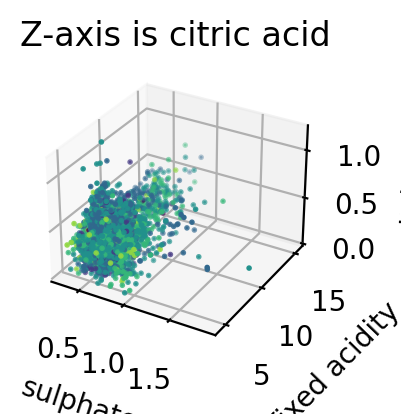

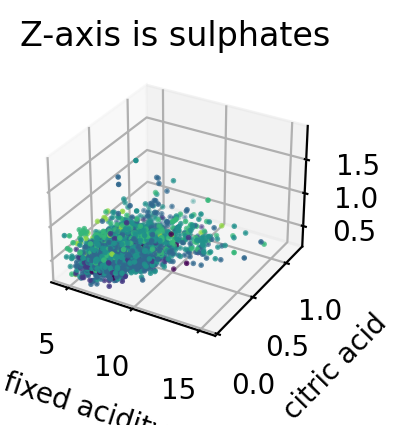

-----------------------

Combination 16: ['fixed acidity', 'citric acid', 'alcohol']


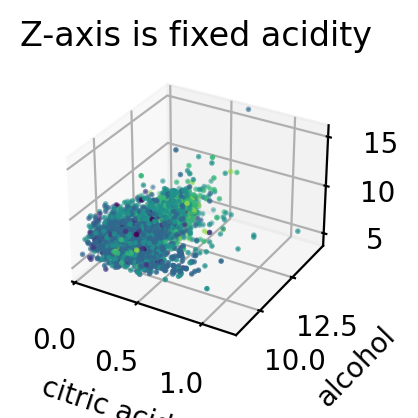

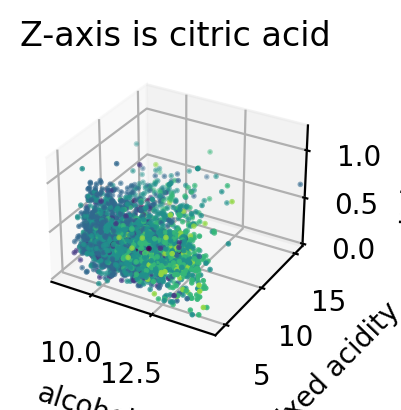

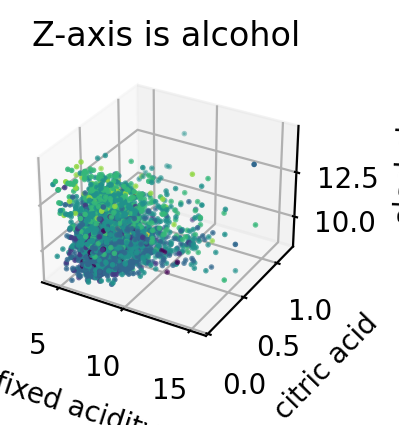

-----------------------

Combination 17: ['fixed acidity', 'residual sugar', 'chlorides']


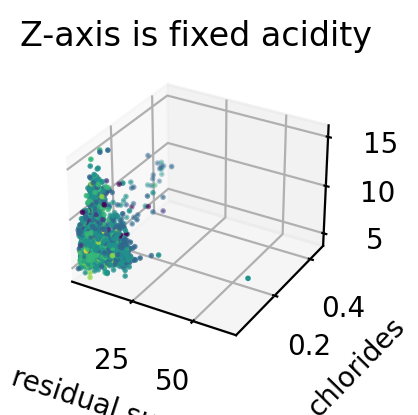

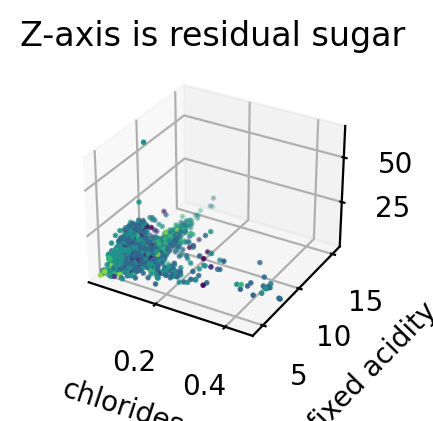

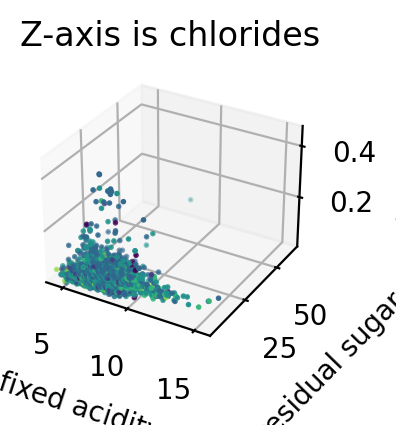

-----------------------

Combination 18: ['fixed acidity', 'residual sugar', 'free sulfur dioxide']


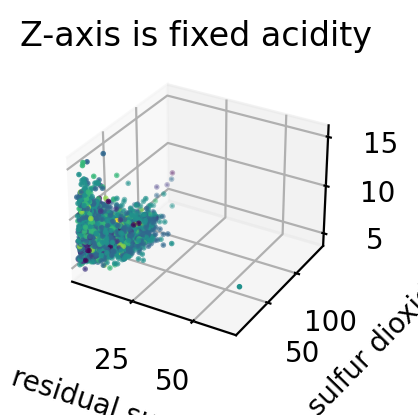

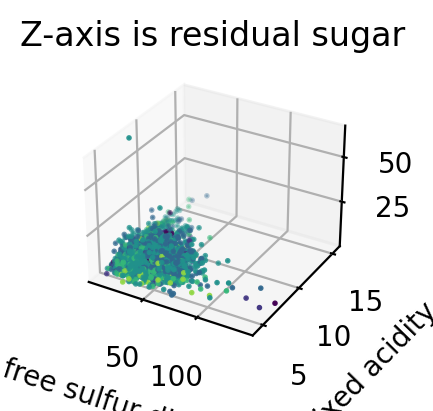

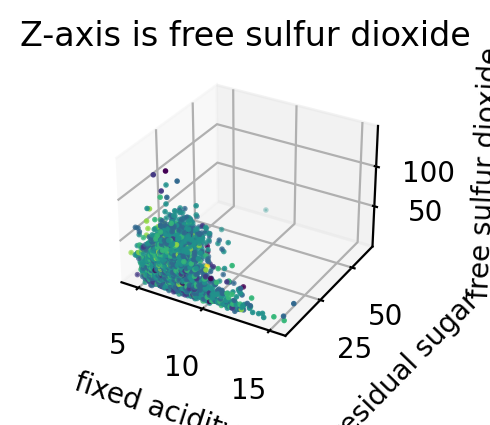

-----------------------

Combination 19: ['fixed acidity', 'residual sugar', 'total sulfur dioxide']


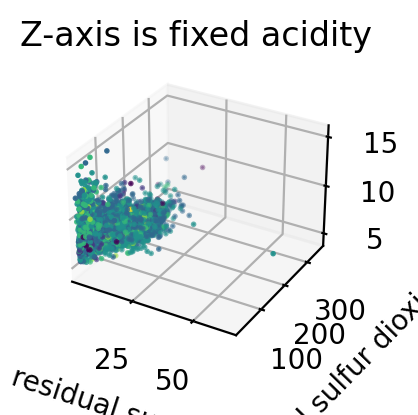

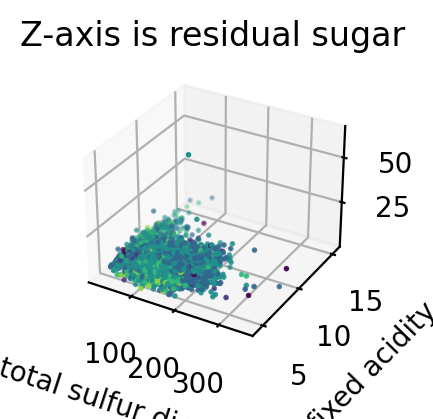

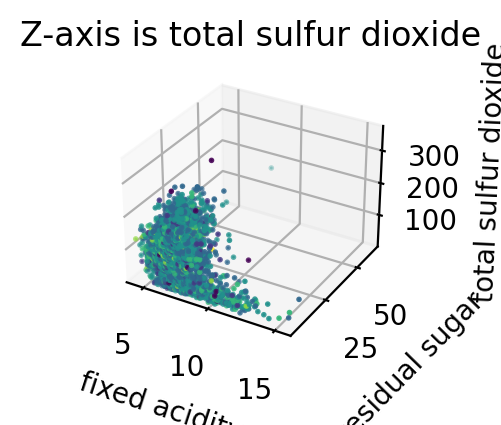

-----------------------

Combination 20: ['fixed acidity', 'residual sugar', 'density']


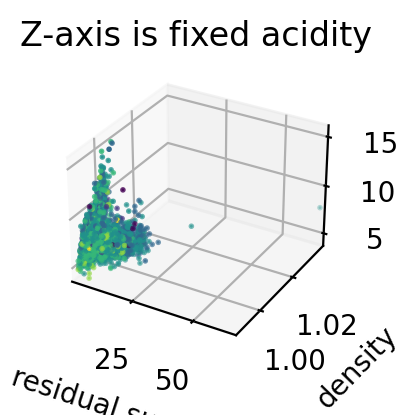

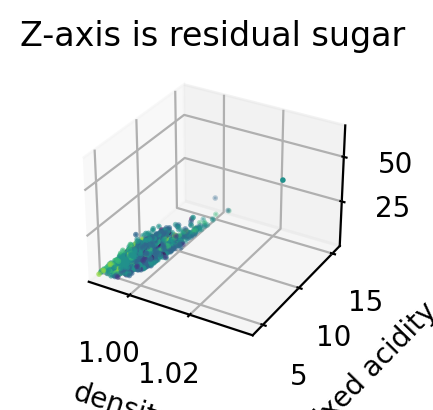

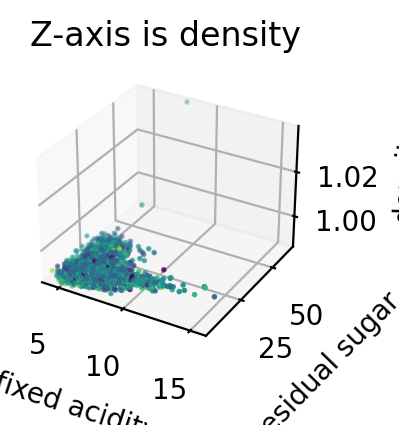

-----------------------

Combination 21: ['fixed acidity', 'residual sugar', 'pH']


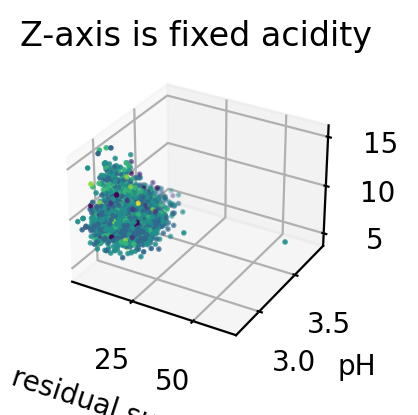

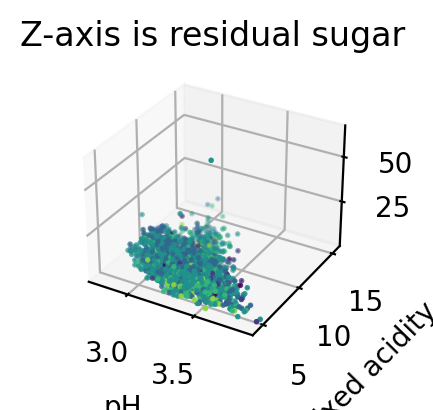

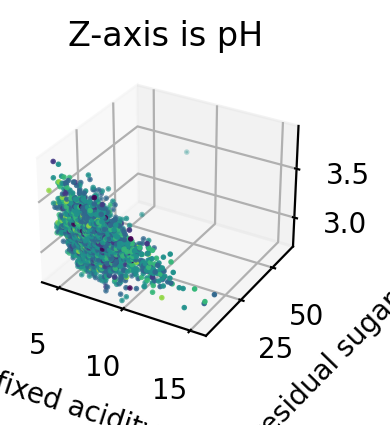

-----------------------

Combination 22: ['fixed acidity', 'residual sugar', 'sulphates']


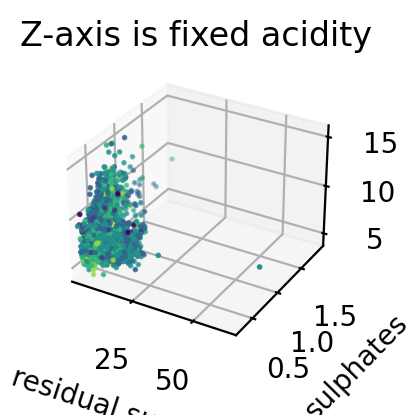

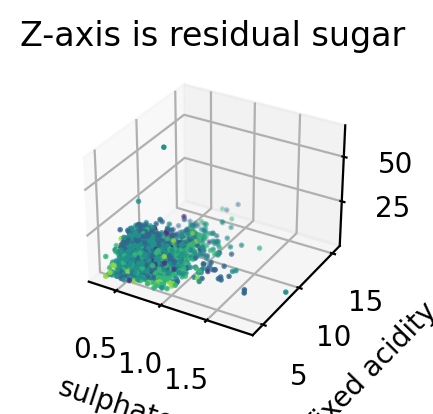

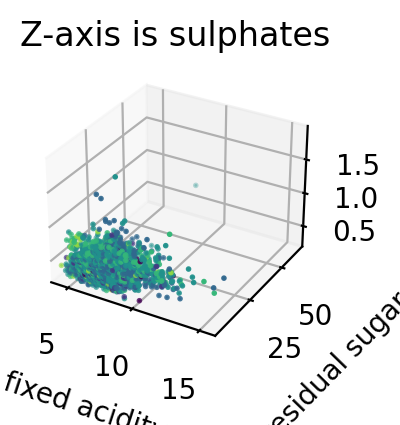

-----------------------

Combination 23: ['fixed acidity', 'residual sugar', 'alcohol']


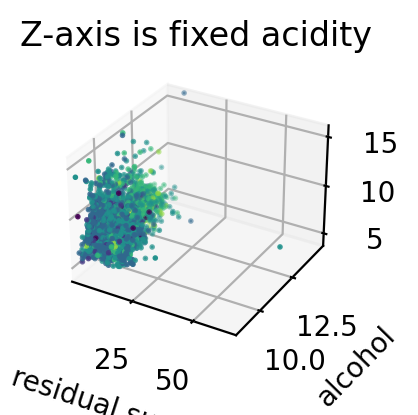

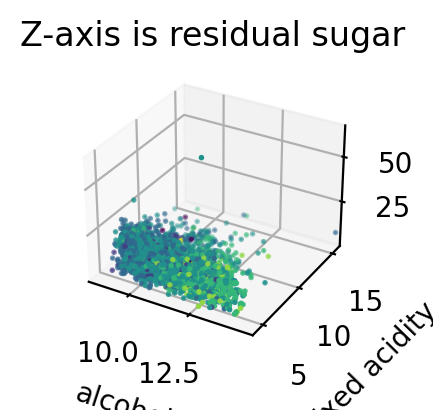

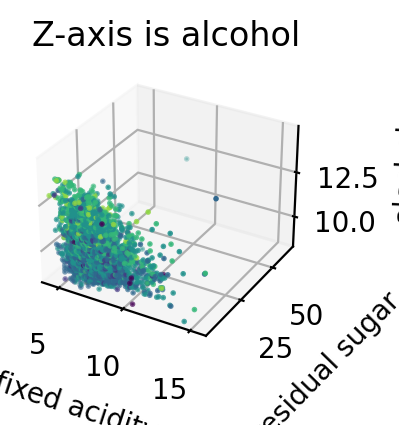

-----------------------

Combination 24: ['fixed acidity', 'chlorides', 'free sulfur dioxide']


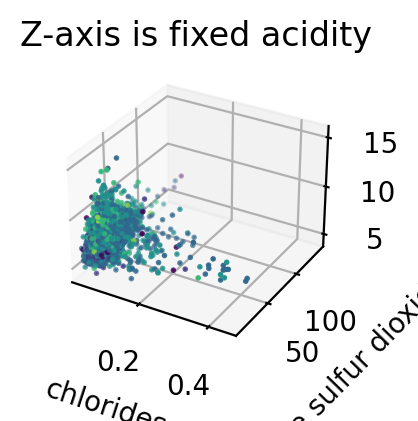

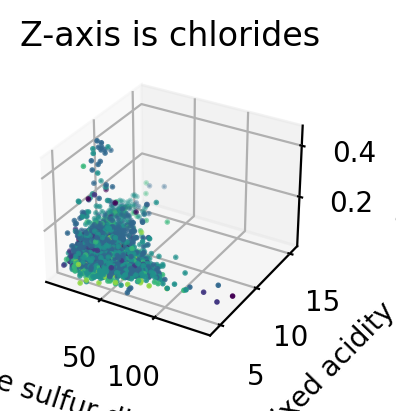

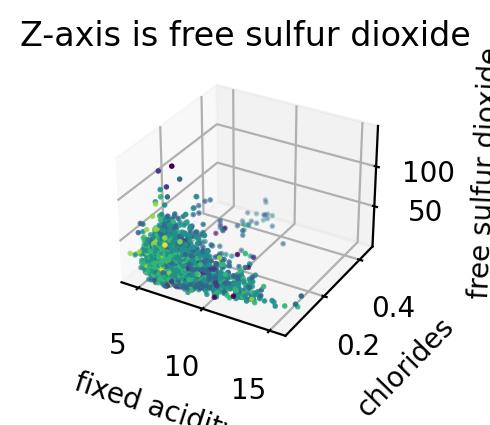

-----------------------

Combination 25: ['fixed acidity', 'chlorides', 'total sulfur dioxide']


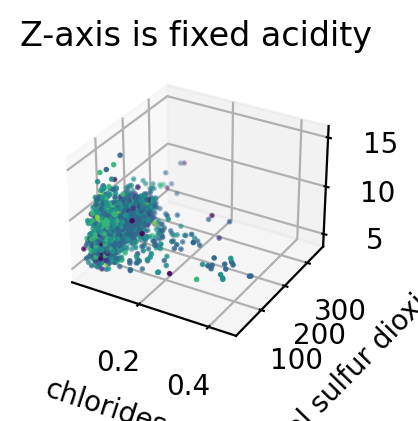

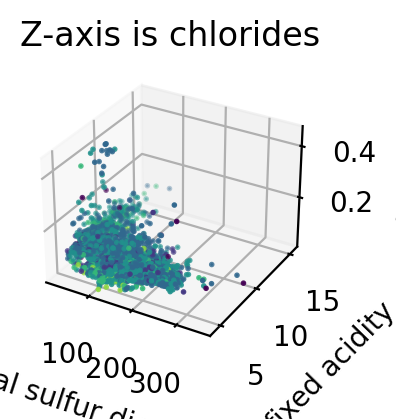

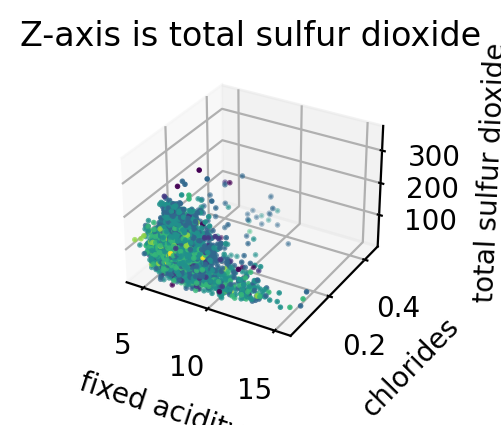

-----------------------

Combination 26: ['fixed acidity', 'chlorides', 'density']


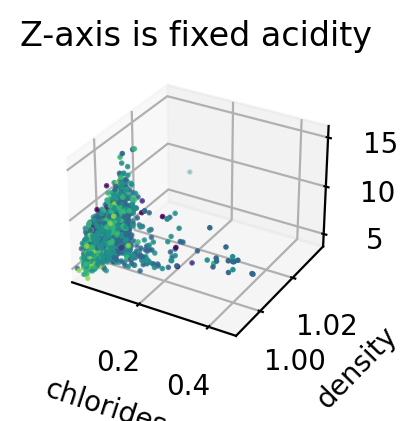

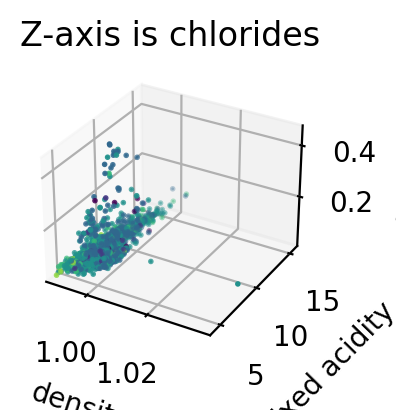

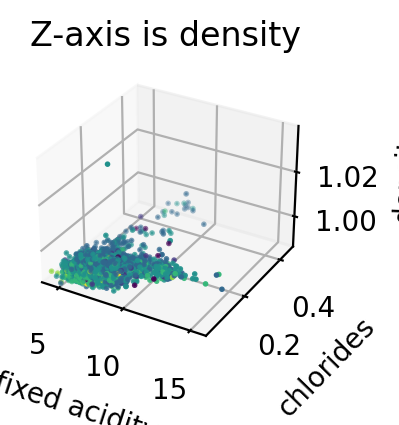

-----------------------

Combination 27: ['fixed acidity', 'chlorides', 'pH']


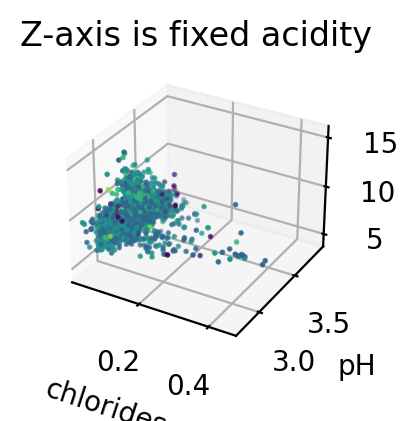

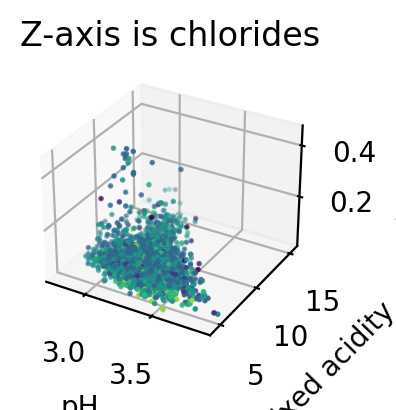

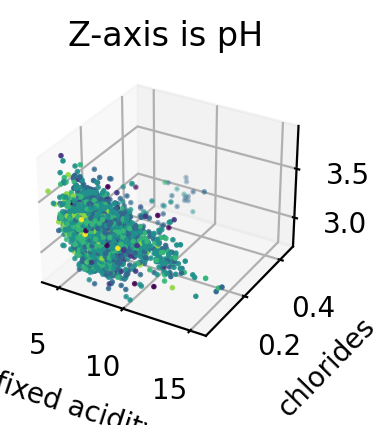

-----------------------

Combination 28: ['fixed acidity', 'chlorides', 'sulphates']


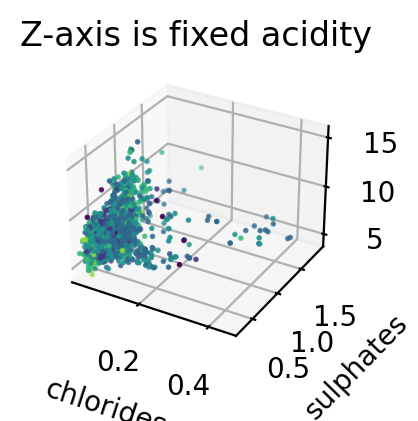

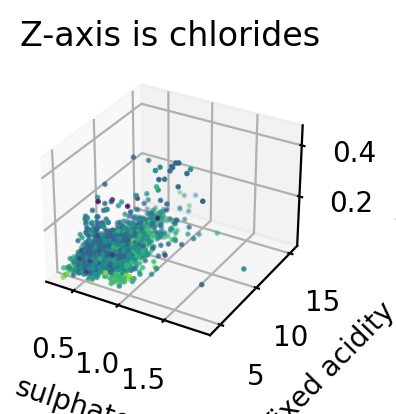

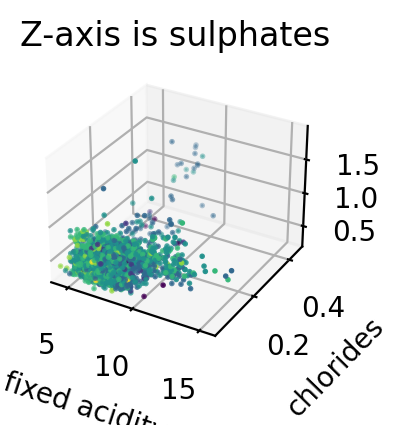

-----------------------

Combination 29: ['fixed acidity', 'chlorides', 'alcohol']


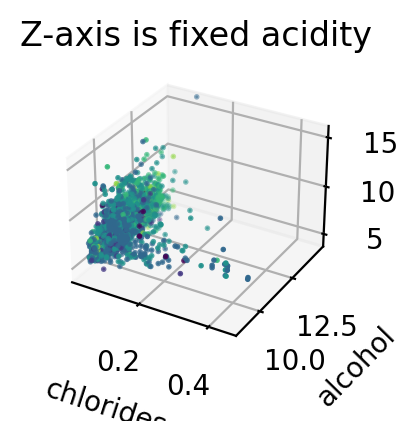

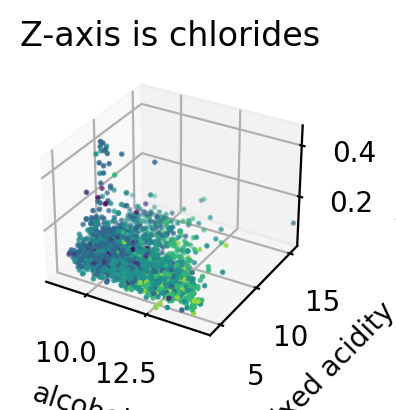

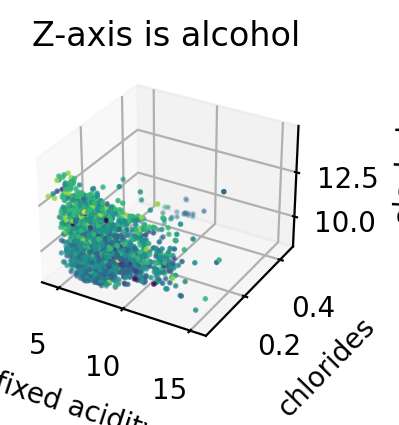

-----------------------

Combination 30: ['fixed acidity', 'free sulfur dioxide', 'total sulfur dioxide']


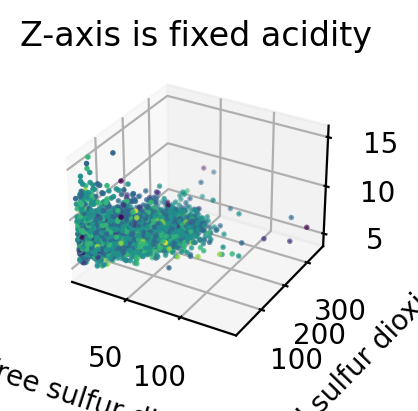

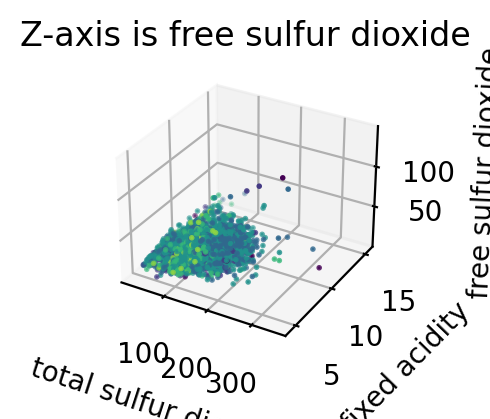

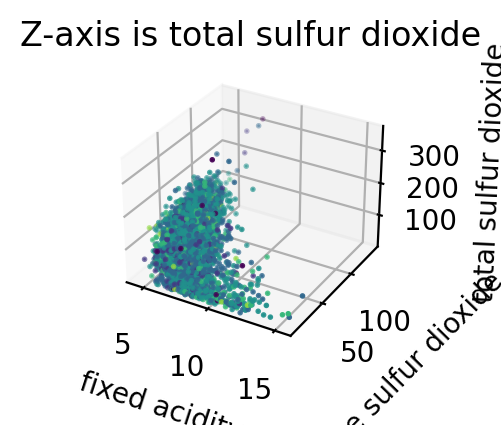

-----------------------

Combination 31: ['fixed acidity', 'free sulfur dioxide', 'density']


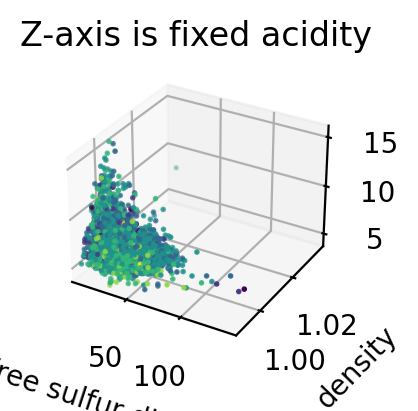

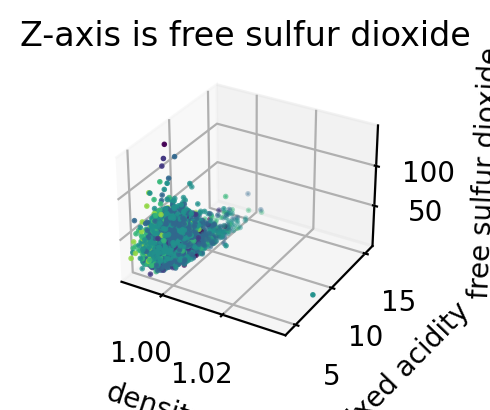

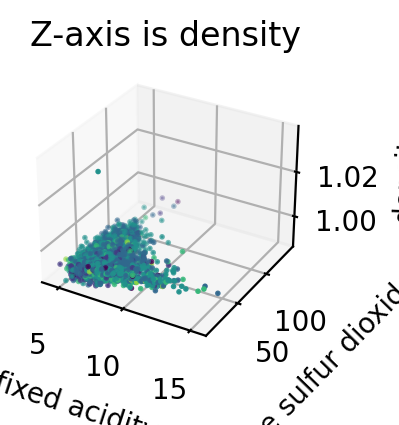

-----------------------

Combination 32: ['fixed acidity', 'free sulfur dioxide', 'pH']


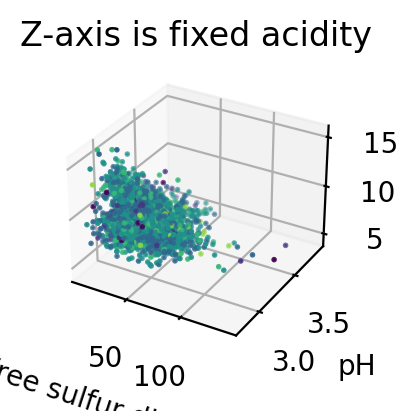

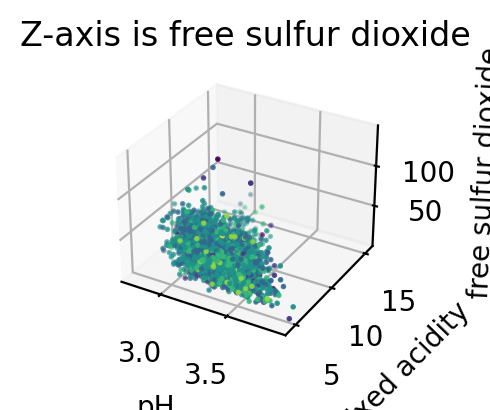

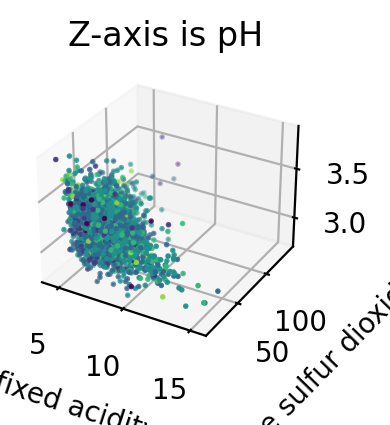

-----------------------

Combination 33: ['fixed acidity', 'free sulfur dioxide', 'sulphates']


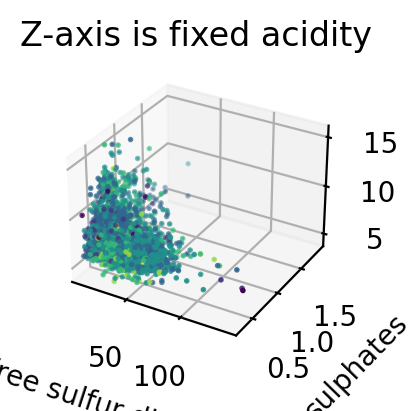

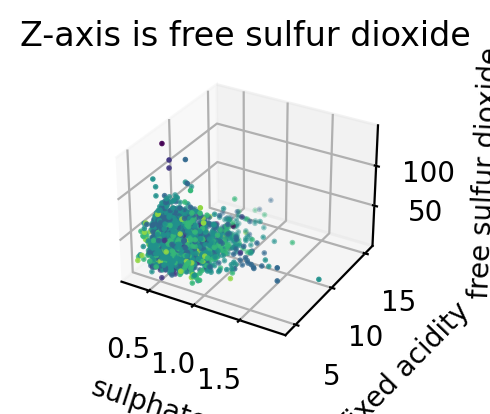

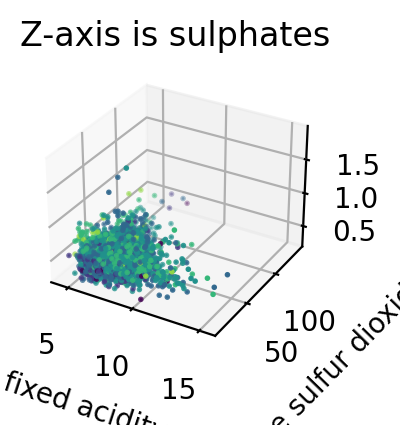

-----------------------

Combination 34: ['fixed acidity', 'free sulfur dioxide', 'alcohol']


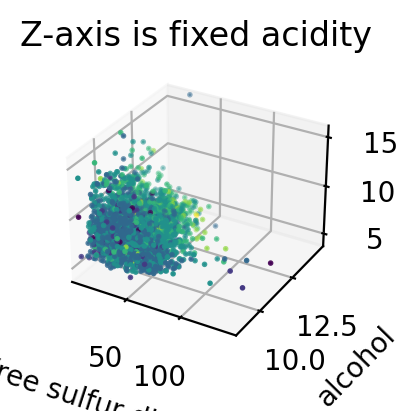

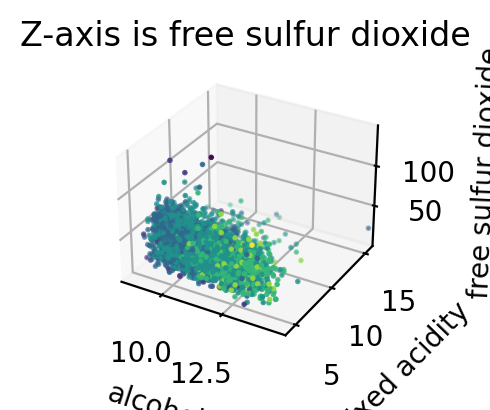

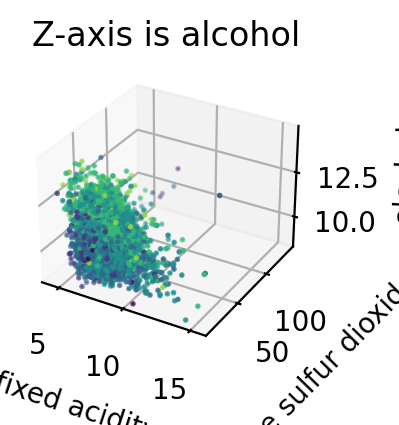

-----------------------

Combination 35: ['fixed acidity', 'total sulfur dioxide', 'density']


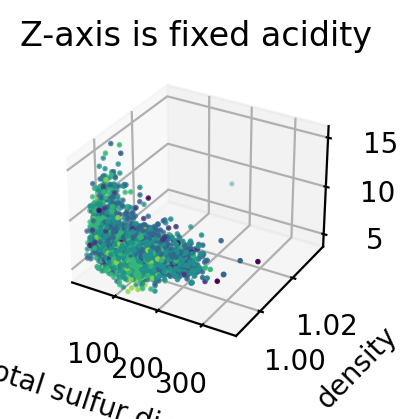

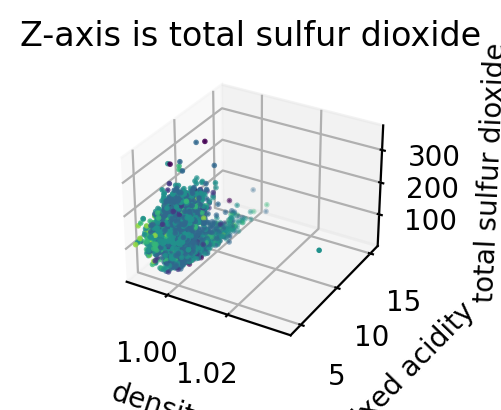

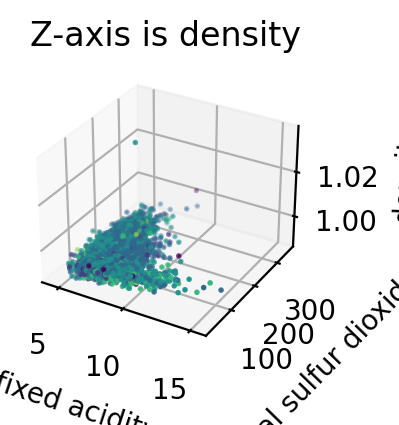

-----------------------

Combination 36: ['fixed acidity', 'total sulfur dioxide', 'pH']


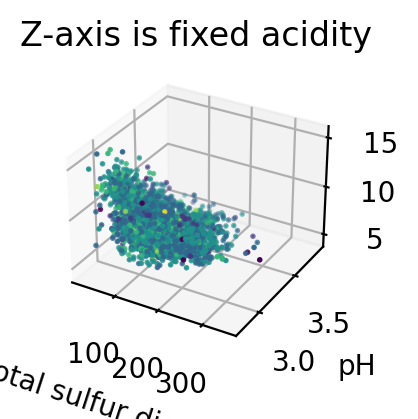

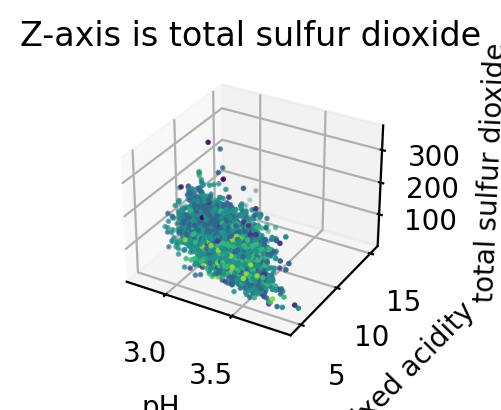

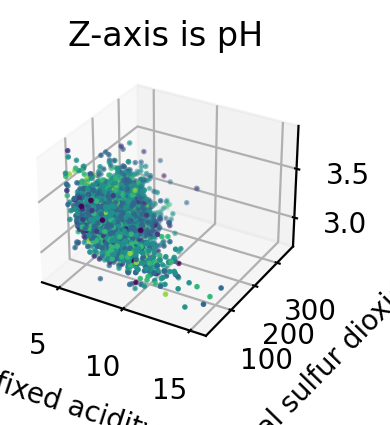

-----------------------

Combination 37: ['fixed acidity', 'total sulfur dioxide', 'sulphates']


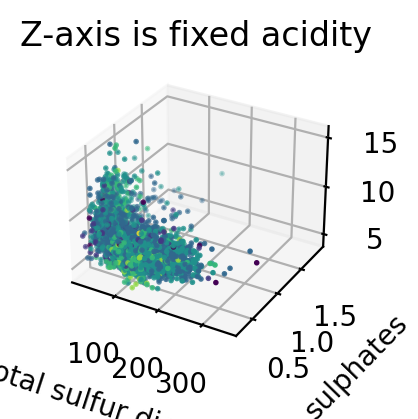

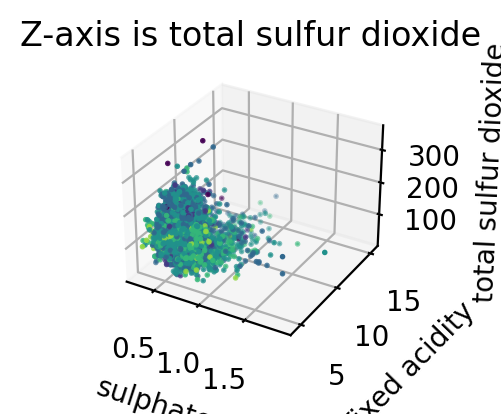

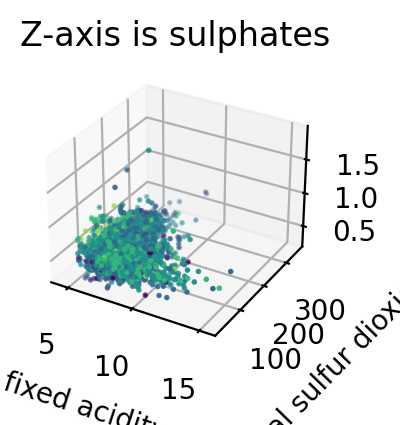

-----------------------

Combination 38: ['fixed acidity', 'total sulfur dioxide', 'alcohol']


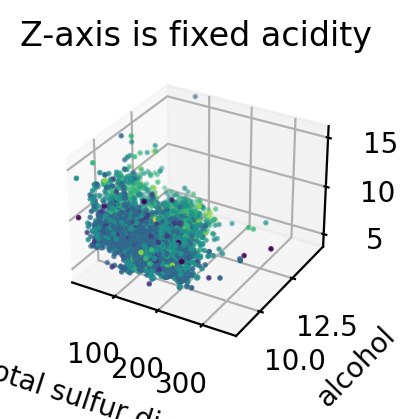

KeyboardInterrupt: 

In [69]:
threedee_feature_shifting(train, features, 'quality')

In [ ]:
import pandas as pd

# Assuming you have a DataFrame called 'train' with a 'quality' column containing integers from 3 to 9

# Define the bin edges
bin_edges = [3, 4.5, 6.5, 9]

# Define the bin labels (you can customize the labels as desired)
bin_labels = [1, 2, 3]

# Use pd.cut() to create the new column 'quality_binned'
train['quality_binned'] = pd.cut(train['quality'], bins=bin_edges, labels=bin_labels, right=False)

# Display the modified DataFrame with the new column
train.head()


In [70]:
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import itertools

def threedee_feature_shifting(train, predictive_features, target):
    '''
    Set the 'lists' list to sets of three predictive features and run this function to produce visualizations
    of each set of features in three dimensions from each perspective. Useful in clustering projects. Sort of a 3D pairplot.
    
    '''
    # Generate all combinations of the elements with different lengths (1 to len(elements))
    all_combinations = []
    
    combinations = list(itertools.combinations(predictive_features, 3))
    all_combinations.extend(combinations)
    
    # Convert the list of tuples to a list of lists using list comprehension
    lists_of_combinations = [list(combination) for combination in all_combinations]
    
    # Calculate the number of subplots in each row
    num_subplots_per_row = min(3, len(lists_of_combinations))
    # Calculate the width of each subplot based on the number of subplots in each row
    subplot_width = 35 / num_subplots_per_row
    
    # iterates through each first-order list
    for k in range(len(lists_of_combinations)):
        
        # Prints the header
        print(f'Combination {k + 1}: {lists_of_combinations[k]}')
        
        # Create the 3D figure with the adjusted figsize
        fig = plt.figure(figsize=(subplot_width, 8))
              
        # iterates through the three combinations of each second-order list
        for i in range(0,3):
            
            # Sample data with three dimensions (x, y, z)
            x = train[lists_of_combinations[k][(1 + i) % 3]]
            y = train[lists_of_combinations[k][(2 + i) % 3]]
            z = train[lists_of_combinations[k][(3 + i) % 3]]
            
            # Calculate each subplot coord
            rows = str(1)
            columns = str(3)
            num = str(i+1)
            coord = int(rows + columns + num)

            # Create a 3D subplot
            ax = fig.add_subplot(coord, projection='3d')

            # Plot the data points as a scatter plot
            scatter = ax.scatter(x, y, z, c=train[target], cmap='jet', s=1)

            # Set your x and y ranges
            ax.set_xlim(x.min(), x.max())
            ax.set_ylim(y.min(), y.max())
            ax.set_zlim(z.min(), z.max())
            
            # Set labels for the axes
            ax.set_xlabel(lists_of_combinations[k][(1 + i) % 3])
            ax.set_ylabel(lists_of_combinations[k][(2 + i) % 3])
            #ax.set_zlabel(lists_of_combinations[k][(3 + i) % 3])

            # Set the title of the plot
            ax.set_title(f'Z-axis is {lists_of_combinations[k][i]}')

        # Show the plot
        plt.show()

        print('\n\n-----------------------\n')

In [71]:
# Example usage
# Assuming you have a DataFrame called "train" and a list of predictive features and the target column
predictive_features = ['alcohol', 'volatile acidity', 'chlorides’, ‘density', 'citric acid', 'residual sugar', 'pH']
target_column = 'quality_binned'
threedee_feature_shifting(train, predictive_features, target_column)

Combination 1: ['alcohol', 'volatile acidity', 'chlorides’, ‘density']


KeyError: 'chlorides’, ‘density'

<Figure size 1166.67x800 with 0 Axes>

In [ ]:
train.columns.to_list()

In [ ]:
# Assuming 'train' is your DataFrame and 'quality' is the column name
sns.set(style='whitegrid')  # Optional: Set the desired seaborn style

plt.figure(figsize=[5, 50])  # Adjust the height and width as per your preference
sns.displot(train[target], height=10, aspect=5, discrete=True, bins=train[target].nunique());  # Adjust the height and aspect ratio as per your preference

# Set x-axis tick label font size
plt.xticks(fontsize=40)  # Adjust the font size (e.g., 30) as per your preference
plt.yticks(fontsize=40)  # Adjust the font size (e.g., 30) as per your preference

plt.xlabel(xlabel='Qualty Rating', fontsize=50)
plt.ylabel(ylabel='Count', fontsize=50)

plt.show(block=False)

In [72]:
import pandas as pd 
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import itertools

def threedee_feature_shifting(train, predictive_features, target):
    '''
    Set the 'lists' list to sets of three predictive features and run this function to produce visualizations
    of each set of features in three dimensions from each perspective. Useful in clustering projects. Sort of a 3D pairplot.
    
    '''
    # Generate all combinations of the elements with length of three
    all_combinations = []
    
    combinations = list(itertools.combinations(predictive_features, 3))
    all_combinations.extend(combinations)
    
    # Convert the list of tuples to a list of lists using list comprehension
    lists_of_combinations = [list(combination) for combination in all_combinations]
    
    # Calculate the number of subplots in each row
    num_subplots_per_row = min(3, len(lists_of_combinations))
    # Calculate the width of each subplot based on the number of subplots in each row
    subplot_width = 35 / num_subplots_per_row
    
    # Create a margin
    print("\n\n")
        
    # Draw the distribution
    sns.set(style='whitegrid')  # Optional: Set the desired seaborn style
    
    plt.figure(figsize=[5, 50])  # Adjust the height and width as per your preference
    sns.displot(train[target], height=9, aspect=5, discrete=True, bins=train[target].nunique());  # Adjust the height and aspect ratio as per your preference
    
    # Set x-axis tick label font size
    plt.xticks(fontsize=40)  # Adjust the font size (e.g., 30) as per your preference
    plt.yticks(fontsize=30)  # Adjust the font size (e.g., 30) as per your preference
    
    cap_target = target.capitalize()
    
    plt.xlabel(xlabel=cap_target, fontsize=50)
    plt.ylabel(ylabel='Count', fontsize=50)
    
    plt.title(f'3D Feature Shifting for {cap_target} Clusters', fontsize=120, pad=250, fontweight='bold')
    plt.show(block=False)

    # Create a new figure for the color bar and subplots
    fig = plt.figure(figsize=(35, 8))

    # Create a scatter plot for the color bar
    values = sorted(train[target].unique().tolist())
    ax_cbar = fig.add_axes([.2, .15, 2, 0.1])  # [left, bottom, width, height]
    scatter_cbar = mpl.colorbar.ColorbarBase(ax_cbar, values=values, cmap='rainbow', orientation='horizontal')
    scatter_cbar.set_label(cap_target, fontsize=50)
    scatter_cbar.ax.tick_params(labelsize=50)

    # Show the color bar
    plt.show()

    # Create a margin
    print('\n')
    
    # iterates through each first-order list
    for k in range(len(lists_of_combinations)):
        
        # Prints the header
        print(f'Combination {k + 1}: {lists_of_combinations[k]}')
        
        # Create the 3D figure with the adjusted figsize
        fig = plt.figure(figsize=(subplot_width, 8))
              
        # iterates through the combinations
        for i in range(len(lists_of_combinations[k])):
            # Sample data with three dimensions (x, y, z)
            x = train[lists_of_combinations[k][i % len(lists_of_combinations[k])]]
            y = train[lists_of_combinations[k][(i + 1) % len(lists_of_combinations[k])]]
            z = train[lists_of_combinations[k][(i + 2) % len(lists_of_combinations[k])]]
            
            # Calculate each subplot coord
            rows = str(1)
            columns = str(3)
            num = str(i+1)
            coord = int(rows + columns + num)

            # Create a 3D subplot
            ax = fig.add_subplot(coord, projection='3d')

            # Plot the data points as a scatter plot
            scatter = ax.scatter(x, y, z, c=train[target], cmap='rainbow', s=1)

            # Set your x and y ranges
            ax.set_xlim(x.min(), x.max())
            ax.set_ylim(y.min(), y.max())
            ax.set_zlim(z.min(), z.max())
            
            # Set labels for the axes
            ax.set_xlabel(lists_of_combinations[k][i % len(lists_of_combinations[k])])
            ax.set_ylabel(lists_of_combinations[k][(i + 1) % len(lists_of_combinations[k])])

            # Set the title of the plot
            ax.set_title(f'Z-axis is {lists_of_combinations[k][(i + 2) % len(lists_of_combinations[k])]}', fontsize=12)
        

        # Show the plot
        plt.show()

        print('\n\n-----------------------\n')

In [73]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import itertools
import matplotlib as mpl

def threedee_feature_shifting(train, predictive_features, target):
    '''
    Set the 'list_of_combinations' list to sets of three predictive features and run this function to produce visualizations
    of each set of features in three dimensions from each perspective. Useful in clustering projects. Sort of a 3D pairplot.
    
    '''
    # Generate all combinations of the elements with length of three
    all_combinations = []
    
    combinations = list(itertools.combinations(predictive_features, 3))
    all_combinations.extend(combinations)
    
    # Convert the list of tuples to a list of lists using list comprehension
    lists_of_combinations = [list(combination) for combination in all_combinations]
    
    # Calculate the number of subplots in each row
    num_subplots_per_row = min(3, len(lists_of_combinations))
    # Calculate the width of each subplot based on the number of subplots in each row
    subplot_width = 35 / num_subplots_per_row
    
    # Create a new figure for the color bar and subplots
    fig = plt.figure(figsize=(35, 8))

    # Create a scatter plot for the color bar
    ax_cbar = fig.add_axes([0.2, 0.15, 0.6, 0.02])  # [left, bottom, width, height]
    scatter_cbar = mpl.colorbar.ColorbarBase(ax_cbar, cmap='rainbow', orientation='horizontal')
    scatter_cbar.set_label(target)
    scatter_cbar.set_ticks(range(3, 10))

    # iterates through each first-order list
    for k in range(len(lists_of_combinations)):
        
        # Prints the header
        print(f'Combination {k + 1}: {lists_of_combinations[k]}')
        
        # Create the 3D subplot with the adjusted figsize
        ax = fig.add_subplot(1, num_subplots_per_row, k, projection='3d')
              
        # iterates through the combinations
        for i in range(len(lists_of_combinations[k])):
            # Sample data with three dimensions (x, y, z)
            x = train[lists_of_combinations[k][i % len(lists_of_combinations[k])]]
            y = train[lists_of_combinations[k][(i + 1) % len(lists_of_combinations[k])]]
            z = train[lists_of_combinations[k][(i + 2) % len(lists_of_combinations[k])]]

            # Plot the data points as a scatter plot
            scatter = ax.scatter(x, y, z, c=train[target], cmap='rainbow', s=1)

            # Set your x and y ranges
            ax.set_xlim(x.min(), x.max())
            ax.set_ylim(y.min(), y.max())
            ax.set_zlim(z.min(), z.max())
            
            # Set labels for the axes
            ax.set_xlabel(lists_of_combinations[k][i % len(lists_of_combinations[k])])
            ax.set_ylabel(lists_of_combinations[k][(i + 1) % len(lists_of_combinations[k])])

            # Set the title of the plot
            ax.set_title(f'Z-axis is {lists_of_combinations[k][(i + 2) % len(lists_of_combinations[k])]}', fontsize=10)
        
    # Show the plots
    plt.show()


In [ ]:
train.columns.tolist()

In [ ]:
train['color_encoded'] = pd.get_dummies(train.color, drop_first=True)

Combination 1: ['fixed acidity', 'volatile acidity', 'citric acid']


ValueError: num must be an integer with 1 <= num <= 3, not 0

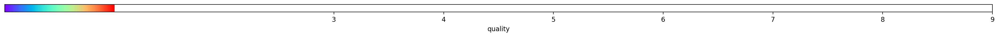

In [74]:
# Example usage
# Assuming you have a DataFrame called "train" and a list of predictive features and the target column
predictive_features = ['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol',
 'color_encoded']
target = 'quality'
threedee_feature_shifting(train, predictive_features, target)

In [ ]:
best_relationships = [
['fixed acidity', 'chloride', 'alcohol'],
['fixed acidity', 'density', 'alcohol'],
['citric acid', 'chlorides', 'alcohol'],
['citric acid', 'pH', 'alcohol'],
['residual sugar', 'free sulfur dioxide', 'alcohol'],
['volatile acidity', 'chlorides', 'alcohol'],
['fixed acidity', 'free sulfur dioxide', 'alcohol'],
['volatile acidity', 'free sulfur dioxide', 'alcohol'],
['alcohol', 'pH', 'volatile'],
['alcohol', 'sulphates', 'free sulfur dioxide'],
['alcohol', 'fixed acidity', 'pH'],
['alcohol', 'fixed acidity', 'residual sugar'],
['fixed acidity', 'citric acid', 'sulphates'],
['alcohol', 'fixed acidity', 'volatile acidity'],
['alcohol', 'citric acid', 'volatile acidity']
]